In this notebook, I am playing around with the code required to take an image that is saved in the local Postgres database and utilize it in some way. We know that we will be doing some machine learning to locate the dart board, as well as computer vision tasks in order to locate darts, but I mostly concerned with setting up the framework to simply to the following:

<strong>Take an image from the database ---> display it/ read it ---> generate a fake score for it (something we will do for real later) ---> and save it to an appropriate table. Probably a new table I need to create.</strong> 

In [1]:
import os
os.environ['MPLCONFIGDIR'] = '/tmp/matplotlib'

import matplotlib
matplotlib.use('Agg')


from shapely.geometry import Point, Polygon
import json
import psycopg2
from PIL import Image
from io import BytesIO
import base64
# import matplotlib.pyplot as plt
from psycopg2 import sql
from scipy.ndimage import rotate
import cv2
import numpy as np
import sqlite3
import numpy as np
from scipy.ndimage import rotate
import io
import base64
from PIL import Image
import psycopg2
from PIL import Image
from io import BytesIO
import matplotlib.patches as patches

def aruco_homography(img):
    # Load image
    # img = cv2.imread(img)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Define the ArUco dictionary and parameters
    dictionary = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_ARUCO_ORIGINAL)
    parameters = cv2.aruco.DetectorParameters()
    detector = cv2.aruco.ArucoDetector(dictionary, parameters)
    
    # Detect ArUco markers
    markerCorners, markerIds, rejectedCandidates = detector.detectMarkers(img)
    
    # print("Detected marker IDs:", markerIds)
    # print("Detected marker corners:", markerCorners)
    
    # Initialize src_rect
    src_rect = None
    
    # Check if we found any markers
    if markerIds is not None:
        # Create a mapping from marker ID to its corner
        id_to_corner = {8: None, 10: None, 9: None, 7: None}
        
        for i, marker_id in enumerate(markerIds.flatten()):
            if marker_id in id_to_corner:
                id_to_corner[marker_id] = markerCorners[i][0]  # Store the corner for the corresponding ID
    
        # Check if all required markers were found
        if all(corner is not None for corner in id_to_corner.values()):
            # Map corners based on your description
            src_rect = np.float32([
                id_to_corner[7][0],  # Bottom Right (ID 7) -> Top Left
                id_to_corner[10][1], # Top Right (ID 10) -> Bottom Left
                id_to_corner[9][0],  # Bottom Left (ID 9) -> Top Right
                id_to_corner[8][1]   # Top Left (ID 8) -> Bottom Right
            ])
        else:
            raise ValueError("Not all required ArUco markers were found.")
    else:
        raise ValueError("No ArUco markers detected.")
    
    # Define the destination rectangle
    width = 2000
    height = 2000  
    dst_rect = np.float32([
        [width - 1, height - 1],  # id 7
        [width - 1, 0],           # id 10
        [0, height - 1],  # id 9
        [0,0]          # id 8
    ])
    
    # Compute transform and warp
    M = cv2.getPerspectiveTransform(src_rect, dst_rect)
    warped = cv2.warpPerspective(img, M, (width, height))
    warped_rgb = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)
    
    # Save the resulting warped image
    # output_path = "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_3.jpg"
    # cv2.imwrite(output_path, warped)
    
    # Plotting the results
    # plt.figure(figsize=(14, 7))
    
    # plt.subplot(1, 2, 1)
    # plt.imshow(img_rgb)
    # if markerIds is not None:
    #     for corner in markerCorners:
    #         plt.scatter(corner[0][:, 0], corner[0][:, 1], c='red', s=30)
    # plt.scatter(src_rect[:, 0], src_rect[:, 1], c='blue', s=30)  # Show the src_rect points
    # plt.title("Original Image with Detected ArUco Markers")
    # plt.axis('off')
    
    # plt.subplot(1, 2, 2)
    # plt.imshow(warped_rgb)
    # plt.title("Warped Frontal View of Dartboard")
    # plt.axis('off')
    
    # plt.tight_layout()
    # plt.show()

    return warped

def find_best_rotation(img1, img2, angle_range=(-10, 10), step=1):
    best_angle = 0
    min_mse = float('inf')
    best_rotated_img = img2

    # Use np.arange for fractional steps
    for angle in np.arange(angle_range[0], angle_range[1] + step, step):
        rotated_img = rotate_image(img2, angle)
        mse = calculate_mse(img1, rotated_img)

        if mse < min_mse:
            min_mse = mse
            best_angle = angle
            best_rotated_img = rotated_img

    return best_angle, best_rotated_img

def resize_images(img1, img2):
    # Resize img2 to match img1 if they are not the same size
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]), interpolation=cv2.INTER_AREA)
    return img1, img2

def rotate_aruco(original, blank):

    img1 = cv2.imread(blank)

    img2 = original
    img1, img2 = resize_images(img1, img2)
    best_angle, best_rotated_img = find_best_rotation(img1, img2, angle_range=(-10, 10), step=.5)

    # Save the rotated image with "_rotated" appended to the filename
    # cv2.imwrite("../Sample Images/best_rotation_image.jpg", best_rotated_img)

    # visualize_results(img1, img2, best_rotated_img, best_angle)
    return best_rotated_img

def visualize_results(img1, img2, best_rotated_img, best_angle):
    # Plot the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Best Rotated Image (Angle: {})'.format(best_angle))
    plt.imshow(cv2.cvtColor(best_rotated_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Original Image 2')
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def load_images(image_path1, image_path2):
    # Load the images
    img1 = cv2.imread(image_path1)
    img2 = cv2.imread(image_path2)

    if img1 is None or img2 is None:
        raise ValueError("One of the images could not be loaded.")

    return img1, img2

def get_tips_and_compute_score(rotated_aruco):
    img = rotated_aruco

    # Convert to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Neon yellow dart color range in HSV (tweak as needed)
    lower_yellow = np.array([25, 120, 120])
    upper_yellow = np.array([35, 255, 255])
    mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Morphological operations to clean up the mask
    kernel = np.ones((5, 5), np.uint8)
    mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

    # Find contours
    contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    dart_coords = []

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 150:
            # Draw contour
            cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

            # Compute bounding box
            x, y, w, h = cv2.boundingRect(cnt)
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 200, 200), 1)

            # Estimate dart tip
            tip_index = cnt[:, :, 0].argmax()
            tip = tuple(cnt[tip_index][0])
            dart_coords.append(tip)
            cv2.circle(img, tip, 8, (255, 0, 0), -1)

    regions = create_annotations()

    # Classify each detected dart tip
    scores = []
    for x, y in dart_coords:
        label = classify_dart_hit(x, y, regions)
        scores.append(label)

    # Store scores in the database
    try:
        conn = psycopg2.connect(
            host='localhost',
            dbname='darts',
            user='dart_thrower',
            password='darts',
            port='5432'
        )
        cur = conn.cursor()

        # Get the most recent game_id
        cur.execute("SELECT id FROM games ORDER BY created_at DESC LIMIT 1;")
        game_id = cur.fetchone()[0]

        # Get the last player to shoot
        cur.execute("SELECT player FROM scores WHERE game_id = %s ORDER BY id DESC LIMIT 1;", (game_id,))
        row = cur.fetchone()
        last_player = row[0] if row else "2"
        next_player = "1" if last_player == "2" else "2"

        # Pad or trim scores list to ensure 3 darts
        # Convert "missed" to 0, pad/trim to 3 values
        # print(scores)
        dart_values = [0 if s == "missed" else s for s in scores]
        dart_values += [None, None, None]
        dart_values = dart_values[:3]
        
        insert_query = """
            INSERT INTO scores (game_id, player, dart1, dart2, dart3)
            VALUES (%s, %s, %s, %s, %s)
        """
        cur.execute(insert_query, (game_id, next_player, dart_values[0], dart_values[1], dart_values[2]))

        conn.commit()
        cur.close()
        conn.close()

    except Exception as e:
        print(f"Database error: {e}")
        return json.dumps({
            "status": "error",
            "message": str(e)
        })

    print(json.dumps({
        "status": "success",
        "scores": dart_values
    }))

    return json.dumps({
        "status": "success",
        "scores": dart_values
    })


def classify_dart_hit(x, y, regions):
    point = Point(x, y)
    for region in regions:
        poly = Polygon(region["polygon"])
        if poly.contains(point):
            return region["label"]
    return "missed"

def create_annotations():
    
    with open("/home/tars/Projects/Dart-Vision/Sample Images/labels_updated_annotations_2025-04-15-07-00-25.json", "r") as f:
        data = json.load(f)
    
    # Map category_id to category name
    category_lookup = {cat['id']: cat['name'] for cat in data['categories']}
    
    # Extract polygons and their labels
    regions = []
    for ann in data['annotations']:
        category = category_lookup[ann['category_id']]
        segmentation = ann['segmentation'][0]  # 1 polygon per segment
        polygon = [(segmentation[i], segmentation[i+1]) for i in range(0, len(segmentation), 2)]
        regions.append({"label": category, "polygon": polygon})

    return regions

def rotate_image(image, angle):
    # Get the image dimensions
    (h, w) = image.shape[:2]
    # Calculate the center of the image
    center = (w // 2, h // 2)
    # Perform the rotation
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def calculate_mse(img1, img2):
    # Calculate Mean Squared Error between two images
    return np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)

def display_coco_regions(image, coco_json_path, image_id=1):
    # Load COCO JSON
    with open(coco_json_path, 'r') as f:
        coco = json.load(f)

    # Get category map (id → name)
    cat_map = {cat['id']: cat['name'] for cat in coco['categories']}

    # Get annotations for the specific image
    annotations = [ann for ann in coco['annotations'] if ann['image_id'] == image_id]

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)
    ax.set_title("COCO Dartboard Regions")

    for ann in annotations:
        category_name = cat_map[ann['category_id']]
        for seg in ann['segmentation']:
            # Convert flat list to Nx2 array
            poly = np.array(seg).reshape((-1, 2))
            patch = patches.Polygon(poly, closed=True, fill=False, edgecolor='cyan', linewidth=2)
            ax.add_patch(patch)

            # Skip labeling bullseye and double bullseye
            if category_name.lower() in ['bullseye', 'double bullseye']:
                continue

            # Label in the center of the polygon
            centroid = np.mean(poly, axis=0)
            ax.text(centroid[0], centroid[1], category_name, color='white', fontsize=9,
                    ha='center', va='center', weight='bold',
                    bbox=dict(facecolor='black', alpha=0.5, boxstyle='round'))

    plt.axis('off')
    plt.show()

def run_workflow(img_original,img_blank):
    aruco_warped = aruco_homography(img_original)
    rotated_aruco = rotate_aruco(aruco_warped,img_blank)    
    # display_coco_regions(rotated_aruco, '../Sample Images/labels_updated_annotations_2025-04-15-06-40-23.json')
    get_tips_and_compute_score(rotated_aruco)

def run_recent():
    # Database connection parameters
    hostname = 'localhost'
    username = 'dart_thrower'
    password = 'darts'
    database = 'darts'
    
    # Connect to the PostgreSQL server
    try:
        connection = psycopg2.connect(
            host=hostname,
            user=username,
            password=password,
            dbname=database
        )
    
        # print("Connection to the database established successfully.")
    
        # Create a cursor object
        cursor = connection.cursor()
        
        # Query to retrieve the image data
        cursor.execute("SELECT image_data FROM images ORDER BY id DESC LIMIT 1") # Change the 1 to the ID of your image
        image_data = cursor.fetchone()
    
        if image_data is not None:
            # Print the type of image_data
            # print(f"Retrieved data type: {type(image_data[0])}")
    
            # Decode the Base64 string into bytes
            image_bytes = base64.b64decode(image_data[0])
    
            # Create an image from the bytes
            image = Image.open(BytesIO(image_bytes))
            
            # Display the image using matplotlib
            img_original = rotate(image, angle=270, reshape=True)
            # Convert to NumPy array
            img_rgb = np.array(img_original)
            # Convert RGB to BGR to match cv2.imread()
            img_original = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
            # plt.imshow(img_original)
            # plt.axis('off')  # Hide the axis
            # plt.show()
            img_blank = "/home/tars/Projects/Dart-Vision/Sample Images/template_aruco_blank.jpg"
            run_workflow(img_original,img_blank)

        else:
            print("No image found with the specified ID.")
    
    except Exception as e:
        print(f"An error occurred: {e}")
    
    finally:
        # Close the cursor and connection
        if cursor:
            cursor.close()
        if connection:
            connection.close()

run_recent()

Database error: invalid input syntax for type integer: "bullseye"
LINE 3:             VALUES (80, '1', 'bullseye', 0, 'bullseye')
                                     ^



In [2]:
# Imports
import psycopg2
from PIL import Image
from io import BytesIO
import base64
import matplotlib.pyplot as plt
from psycopg2 import sql
from scipy.ndimage import rotate
import cv2
import numpy as np
import sqlite3
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate
import io
import base64
from PIL import Image
import psycopg2
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO

## Connect to local postrgres db

In [3]:
# Database connection parameters
hostname = 'localhost'
username = 'dart_thrower'
password = 'darts'
database = 'darts'

try:
    connection = psycopg2.connect(
        host=hostname,
        user=username,
        password=password,
        dbname=database
    )

    print("Connection to the database established successfully.")

    cursor = connection.cursor()

    cursor.execute(sql.SQL("SELECT * FROM games LIMIT 5"))  # Replace `your_table_name` with an actual table name
    records = cursor.fetchall()

    print("Records from the table:")
    for record in records:
        print(record)

except Exception as e:
    print(f"An error occurred: {e}")

finally:
    # Close the cursor and connection
    if cursor:
        cursor.close()
    if connection:
        connection.close()

Connection to the database established successfully.
Records from the table:
(1, datetime.datetime(2025, 3, 24, 17, 51, 27, 833086))
(2, datetime.datetime(2025, 3, 24, 17, 54, 6, 198471))
(3, datetime.datetime(2025, 3, 24, 17, 54, 46, 825948))
(4, datetime.datetime(2025, 3, 24, 17, 55, 15, 888245))
(5, datetime.datetime(2025, 3, 24, 17, 59, 22, 982385))


## Displaying an image

In [4]:
# Database connection parameters
hostname = 'localhost'
username = 'dart_thrower'
password = 'darts'
database = 'darts'

# Connect to the PostgreSQL server
try:
    connection = psycopg2.connect(
        host=hostname,
        user=username,
        password=password,
        dbname=database
    )

    print("Connection to the database established successfully.")

    # Create a cursor object
    cursor = connection.cursor()
    
    # Query to retrieve the image data
    cursor.execute("SELECT image_data FROM images WHERE id = %s", (11,))  # Change the 1 to the ID of your image
    image_data = cursor.fetchone()

    if image_data is not None:
        # Print the type of image_data
        print(f"Retrieved data type: {type(image_data[0])}")

        # Decode the Base64 string into bytes
        image_bytes = base64.b64decode(image_data[0])

        # Create an image from the bytes
        image = Image.open(BytesIO(image_bytes))
        
        # Display the image using matplotlib
        image = rotate(image, angle=270, reshape=True)
        plt.imshow(image)
        plt.axis('off')  # Hide the axis
        plt.show()
    else:
        print("No image found with the specified ID.")

except Exception as e:
    print(f"An error occurred: {e}")

finally:
    # Close the cursor and connection
    if cursor:
        cursor.close()
    if connection:
        connection.close()


Connection to the database established successfully.
Retrieved data type: <class 'str'>


## Sending a processed picture back to the db

Here is where we would theoretically do something to the image. Assuming our image is the dart board with darts thrown at it.. we would do everything required to process that image to get a score out of it.

Since we are not at that point, I will just do a random edit to the image we received, and we can pretend that we did whatever was required to get a score. Therefore, <strong> we will assume here at this point that we are returning a processed dartboard, which can return a score from it. We need to create a new table in our database to do this. </strong>

The below will grab the most recent image captured, display it, process it, and return it to a new table called processed_images

In [5]:
hostname = 'localhost'
username = 'dart_thrower'
password = 'darts'
database = 'darts'

def randomDartScores():
    return np.random.randint(1, 21, size=3)  # Random scores between 1 and 20

def processImage(image): # Here we'll turn the image negative
    negative_image = 255 - image
    return negative_image

def process_latest_image():
    # Connect to the PostgreSQL database
    conn = psycopg2.connect(
        host=hostname,
        user=username,
        password=password,
        dbname=database
    )
    
    cursor = conn.cursor()

    # Step 1: Retrieve the image with the largest ID
    cursor.execute("SELECT id, player_name, game_id, image_data FROM images ORDER BY id DESC LIMIT 1")
    latest_image_record = cursor.fetchone()

    if latest_image_record:
        image_id, player_name, game_id, image_data = latest_image_record
        
        # Decode the Base64 string into bytes if image_data is a string
        image_bytes = base64.b64decode(image_data)

        # Create an image from the bytes
        image = Image.open(io.BytesIO(image_bytes))
        image = np.array(image)  # Convert the Image object to a numpy array

        # Rotate the image 270 degrees
        image = rotate(image, angle=270, reshape=True)

        # Process the image (turning it negative)
        image = processImage(image)

        # Display the processed image using matplotlib
        plt.imshow(image)
        plt.axis('off')  # Hide the axis
        plt.show()

        # Get dart scores and convert them to regular integers
        dart_scores = randomDartScores()
        dart_1, dart_2, dart_3 = map(int, dart_scores)  # Converts each score to a Python int

        # Store the image back as bytes
        processed_image_data = io.BytesIO()
        plt.imsave(processed_image_data, image)  # Save the processed image to a BytesIO object
        processed_image_data.seek(0)  # Seek to the beginning

        # Insert into processed_images table
        cursor.execute('''
            INSERT INTO processed_images (dart_1, dart_2, dart_3, game_id, player_name, processed_image)
            VALUES (%s, %s, %s, %s, %s, %s)
        ''', (dart_1, dart_2, dart_3, game_id, player_name, processed_image_data.getvalue()))

        # Commit the changes
        conn.commit()

    else:
        print("No images found in the database.")

    # Close the database connection
    conn.close()


# Run the function to process the latest image
process_latest_image()


## Retreiving the processed image from processed_images, and displaying the data it has

In [6]:
# Database connection parameters
hostname = 'localhost'
username = 'dart_thrower'
password = 'darts'
database = 'darts'

# Connect to the PostgreSQL server
try:
    connection = psycopg2.connect(
        host=hostname,
        user=username,
        password=password,
        dbname=database
    )

    print("Connection to the database established successfully.")

    # Create a cursor object
    cursor = connection.cursor()
    
    # Query to retrieve the image data
    cursor.execute("SELECT processed_image FROM processed_images WHERE id = %s", (1,))  # Change the 1 to the ID of your image
    image_data = cursor.fetchone()

    if image_data is not None:
        # Print the type of image_data
        print(f"Retrieved data type: {type(image_data[0])}")

        # Create an image from the bytes (no decoding necessary)
        image = Image.open(BytesIO(image_data[0]))  # Use image_data[0] directly
        
        # Display the image using matplotlib
        plt.imshow(image)
        plt.axis('off')  # Hide the axis
        plt.show()
    else:
        print("No image found with the specified ID.")

except Exception as e:
    print(f"An error occurred: {e}")

finally:
    # Close the cursor and connection
    if cursor:
        cursor.close()
    if connection:
        connection.close()


Connection to the database established successfully.
Retrieved data type: <class 'memoryview'>


In [7]:
import psycopg2

# Database connection parameters
hostname = 'localhost'
username = 'dart_thrower'
password = 'darts'
database = 'darts'

# Connect to the PostgreSQL server
try:
    connection = psycopg2.connect(
        host=hostname,
        user=username,
        password=password,
        dbname=database
    )

    print("Connection to the database established successfully.")

    # Create a cursor object
    cursor = connection.cursor()
    
    # Query to retrieve all columns for the row where id = 1
    cursor.execute("SELECT * FROM processed_images WHERE id = %s", (1,))
    row = cursor.fetchone()  # Fetch the first row of results

    if row is not None:
        # Print all columns in the retrieved row
        column_names = [desc[0] for desc in cursor.description]
        for column_name, value in zip(column_names, row):
            print(f"{column_name}: {value}")
    else:
        print("No row found with the specified ID.")

except Exception as e:
    print(f"An error occurred: {e}")

finally:
    # Close the cursor and connection
    if cursor:
        cursor.close()
    if connection:
        connection.close()


Connection to the database established successfully.
id: 1
dart_1: 1
dart_2: 17
dart_3: 1
game_id: 34
player_name: Reed
processed_image: <memory at 0x781c35eb6a40>


So now, we can read and write images to our database. We will just need to figure out a scoring function, and flesh out the front end. Add in some "cricket" game logic and we are complete. 

## Messing around with a sample photo (front view)

In [8]:
#!pip install opencv-python numpy tensorflow

All I did in the below was create a function that will grab template photos from an image of the board for the 20 and the 3. We can can use some geometry to get the rest of the board.

You could also just screenshot the 20 and the 3 from the larger photo.

In [9]:
def create_template(image_path, output_20_path, output_3_path):
    # Load the dartboard image
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Image not found.")
        return

    # Define the coordinates for cropping the numbers
    # You may need to adjust these coordinates based on your image
    # Format: (start_x, start_y, width, height)
    coords_20 = (2051,1864,70,70)  # Example coordinates for "20"
    coords_3 = (2066,2635,50,60)   # Example coordinates for "3"

    # Crop the "20" number
    x, y, w, h = coords_20
    template_20 = image[y:y+h, x:x+w]
    cv2.imwrite(output_20_path, template_20)
    print(f"Template for '20' saved to {output_20_path}")

    # Crop the "3" number
    x, y, w, h = coords_3
    template_3 = image[y:y+h, x:x+w]
    cv2.imwrite(output_3_path, template_3)
    print(f"Template for '3' saved to {output_3_path}")

# Only need to do this once to get the intial templates
# create_template(
#     '/home/tars/Projects/Dart-Vision/Sample Images/throw_1_1.JPG',
#     '/home/tars/Projects/Dart-Vision/Templates/20_cropped.png',
#     '/home/tars/Projects/Dart-Vision/Templates/3_cropped.png'
# )


Now, in the below code, we take in the image of our darts that were thrown.. an output path, and our two templates.

The result is a cropped image of the board. 

The next step would be to get this in a workflow such that we are able to pull the most recently captured photo when a user saves a photo from the front end. For now, I am less worried about the logistics of that and more worried about quantifying the board for scoring. 

<strong> One notable shortcoming of this method is that the template for the 20 and the 3 do not currently work for 20's and 3's at different scales. Therefore, if a user zoomed in and took their photo, the board would not be detected correctly. I tested this with the sample photos, and all the photos I took from where I threw the darts worked perfectly fine, despite me not being super careful about where I took the photo from. </strong>

In [10]:
def detect_numbers_and_crop(image_path, output_path, template_20_path, template_3_path):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Image not found.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Load templates for "20" and "3"
    template_20 = cv2.imread(template_20_path, cv2.IMREAD_GRAYSCALE)
    template_3 = cv2.imread(template_3_path, cv2.IMREAD_GRAYSCALE)

    # Perform template matching for 20
    res_20 = cv2.matchTemplate(gray, template_20, cv2.TM_CCOEFF_NORMED)
    threshold_20 = 0.8  # Adjust this threshold as needed
    loc_20 = np.where(res_20 >= threshold_20)

    # Perform template matching for 3
    res_3 = cv2.matchTemplate(gray, template_3, cv2.TM_CCOEFF_NORMED)
    threshold_3 = 0.8  # Adjust this threshold as needed
    loc_3 = np.where(res_3 >= threshold_3)

    print(loc_20[0].size, loc_3[0].size)

    # Check if both numbers were found
    if loc_20[0].size == 0 or loc_3[0].size == 0:
        print("Could not find both numbers on the dartboard.")
        return

    # Get the coordinates of the detected numbers
    top_left_20 = (loc_20[1][0], loc_20[0][0])
    top_left_3 = (loc_3[1][0], loc_3[0][0])

    # Calculate the bottom-left corner of 3
    bottom_left_3 = (top_left_3[0], top_left_3[1] + template_3.shape[0])

    # Calculate the top-right corner of 20
    top_right_20 = (top_left_20[0] + template_20.shape[1], top_left_20[1])

    # Calculate the center and radius of the circle
    center_x = (bottom_left_3[0] + top_right_20[0]) // 2
    center_y = (bottom_left_3[1] + top_left_20[1]) // 2
    radius = int(np.linalg.norm(np.array(bottom_left_3) - np.array(top_right_20)) // 2)

    # Calculate the bounding box for cropping
    x1 = center_x - radius
    y1 = center_y - radius
    x2 = center_x + radius
    y2 = center_y + radius

    # Ensure the coordinates are within the image boundaries
    x1 = max(x1, 0)
    y1 = max(y1, 0)
    x2 = min(x2, image.shape[1])
    y2 = min(y2, image.shape[0])

    # Crop the image
    cropped_image = image[y1:y2, x1:x2]

    # Save the cropped image
    cv2.imwrite(output_path, cropped_image)
    print(f"Cropped image saved to {output_path}")

In [11]:
def generate_scaled_templates(template, scales):
    scaled_templates = []
    for scale in scales:
        # Resize the template
        new_size = (int(template.shape[1] * scale), int(template.shape[0] * scale))
        scaled_template = cv2.resize(template, new_size, interpolation=cv2.INTER_LINEAR)
        scaled_templates.append(scaled_template)
    return scaled_templates

def detect_numbers_and_crop(image_path, output_path, template_20_path, template_3_path):
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Image not found.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Load templates for "20" and "3"
    template_20 = cv2.imread(template_20_path, cv2.IMREAD_GRAYSCALE)
    template_3 = cv2.imread(template_3_path, cv2.IMREAD_GRAYSCALE)

    # Generate scaled templates
    scales = [0.9 + 0.01 * i for i in range(-10, 11)]  # 10 smaller and 10 larger
    scaled_templates_20 = generate_scaled_templates(template_20, scales)
    scaled_templates_3 = generate_scaled_templates(template_3, scales)

    loc_20 = []
    loc_3 = []

    # Perform template matching for each scaled template
    for scaled_template in scaled_templates_20:
        res_20 = cv2.matchTemplate(gray, scaled_template, cv2.TM_CCOEFF_NORMED)
        threshold_20 = 0.8  
        loc_20_level = np.where(res_20 >= threshold_20)
        loc_20.extend(zip(loc_20_level[1], loc_20_level[0]))  # Store (x, y) coordinates

    for scaled_template in scaled_templates_3:
        res_3 = cv2.matchTemplate(gray, scaled_template, cv2.TM_CCOEFF_NORMED)
        threshold_3 = 0.8  # Adjust this threshold as needed
        loc_3_level = np.where(res_3 >= threshold_3)
        loc_3.extend(zip(loc_3_level[1], loc_3_level[0]))  # Store (x, y) coordinates

    print(len(loc_20), len(loc_3))

    if not loc_20 or not loc_3:
        print("Could not find both numbers on the dartboard.")
        return

    # Get the coordinates of the first detected numbers
    top_left_20 = loc_20[0]
    top_left_3 = loc_3[0]

    # Calculate the bottom-left corner of 3
    bottom_left_3 = (top_left_3[0], top_left_3[1] + template_3.shape[0])

    # Calculate the top-right corner of 20
    top_right_20 = (top_left_20[0] + template_20.shape[1], top_left_20[1])

    # Calculate the center and radius of the circle
    center_x = (bottom_left_3[0] + top_right_20[0]) // 2
    center_y = (bottom_left_3[1] + top_left_20[1]) // 2
    radius = int(np.linalg.norm(np.array(bottom_left_3) - np.array(top_right_20)) // 2)

    # Calculate the bounding box for cropping
    x1 = center_x - radius
    y1 = center_y - radius
    x2 = center_x + radius
    y2 = center_y + radius

    # Ensure the coordinates are within the image boundaries
    x1 = max(x1, 0)
    y1 = max(y1, 0)
    x2 = min(x2, image.shape[1])
    y2 = min(y2, image.shape[0])

    # Crop the image
    cropped_image = image[y1:y2, x1:x2]

    # Save the cropped image
    cv2.imwrite(output_path, cropped_image)
    print(f"Cropped image saved to {output_path}")

In [12]:
# get the cropped dartboard of thrown darts
detect_numbers_and_crop(
    '/home/tars/Projects/Dart-Vision/Sample Images/throw_5_1.JPG',
    '/home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG',
    '/home/tars/Projects/Dart-Vision/Templates/20_cropped.png',  # Path to "20" template
    '/home/tars/Projects/Dart-Vision/Templates/3_cropped.png'    # Path to "3" template
)

32 21
Cropped image saved to /home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG


In [13]:
# get the cropped dartboard of no darts thrown for comparison
detect_numbers_and_crop(
    '/home/tars/Projects/Dart-Vision/Sample Images/blank_dartboard.JPG',
    '/home/tars/Projects/Dart-Vision/Sample Images/blank_dartboard_cropped.JPG',
    '/home/tars/Projects/Dart-Vision/Templates/20_cropped.png',  # Path to "20" template
    '/home/tars/Projects/Dart-Vision/Templates/3_cropped.png'    # Path to "3" template
)

39 80
Cropped image saved to /home/tars/Projects/Dart-Vision/Sample Images/blank_dartboard_cropped.JPG


In [14]:
# image = cv2.imread('/home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG')
# image.shape

In [15]:
def visualize_color_spaces(image_path):
    # Load the cropped dartboard image
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Image not found.")
        return

    # Convert to different color spaces
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hls_image = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    ycrcb_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)

    # Set up the matplotlib figure
    plt.figure(figsize=(15, 10))

    # Display Original BGR Image
    plt.subplot(3, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    plt.title('Original BGR')
    plt.axis('off')

    # Display Grayscale Image
    plt.subplot(3, 2, 2)
    plt.imshow(gray_image, cmap='gray')
    plt.title('Grayscale')
    plt.axis('off')

    # Display HSV Image
    plt.subplot(3, 2, 3)
    plt.imshow(hsv_image)
    plt.title('HSV')
    plt.axis('off')

    # Display HLS Image
    plt.subplot(3, 2, 4)
    plt.imshow(hls_image)
    plt.title('HLS')
    plt.axis('off')

    # Display YCrCb Image
    plt.subplot(3, 2, 5)
    plt.imshow(ycrcb_image)
    plt.title('YCrCb')
    plt.axis('off')

    # Display LAB Image
    plt.subplot(3, 2, 6)
    plt.imshow(lab_image)
    plt.title('LAB')
    plt.axis('off')

    # Show the plots
    plt.tight_layout()
    plt.show()

# Example usage
visualize_color_spaces('/home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG')


In [16]:
def resize_images(img1, img2):
    # Resize img2 to match img1 if they are not the same size
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]), interpolation=cv2.INTER_AREA)
    return img1, img2

In [17]:
def load_images(image_path1, image_path2):
    # Load the images
    img1 = cv2.imread(image_path1)
    img2 = cv2.imread(image_path2)

    if img1 is None or img2 is None:
        raise ValueError("One of the images could not be loaded.")

    return img1, img2

def rotate_image(image, angle):
    # Get the image dimensions
    (h, w) = image.shape[:2]
    # Calculate the center of the image
    center = (w // 2, h // 2)
    # Perform the rotation
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def calculate_mse(img1, img2):
    # Calculate Mean Squared Error between two images
    return np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)

def find_best_rotation(img1, img2, angle_range=(-10, 10), step=1):
    best_angle = 0
    min_mse = float('inf')
    best_rotated_img = img2

    # Iterate over the specified range of angles
    for angle in range(angle_range[0], angle_range[1] + 1, step):
        rotated_img = rotate_image(img2, angle)
        mse = calculate_mse(img1, rotated_img)

        if mse < min_mse:
            min_mse = mse
            best_angle = angle
            best_rotated_img = rotated_img

    return best_angle, best_rotated_img

def visualize_results(img1, img2, best_rotated_img, best_angle):
    # Plot the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Best Rotated Image (Angle: {})'.format(best_angle))
    plt.imshow(cv2.cvtColor(best_rotated_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Original Image 2')
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def main():
    image_path1 = '/home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG'
    image_path2 = '/home/tars/Projects/Dart-Vision/Sample Images/blank_dartboard_cropped.JPG'

    img1, img2 = load_images(image_path1, image_path2)
    img1, img2 = resize_images(img1, img2)
    best_angle, best_rotated_img = find_best_rotation(img1, img2, angle_range=(-10, 10), step=1)

    # Save the rotated image with "_rotated" appended to the filename
    rotated_image_path = image_path2.replace('.JPG', '_rotated.JPG')
    cv2.imwrite(rotated_image_path, best_rotated_img)

    visualize_results(img1, img2, best_rotated_img, best_angle)

if __name__ == "__main__":
    main()

In [18]:
def load_images(image_path1, image_path2):
    # Load the images
    img1 = cv2.imread(image_path1)
    img2 = cv2.imread(image_path2)

    if img1 is None or img2 is None:
        raise ValueError("One of the images could not be loaded.")

    return img1, img2

def compare_images(img1, img2):
    # Check if images are identical
    if np.array_equal(img1, img2):
        print("The images are identical.")
        return None, []

    # Convert to HSV color space
    img1_hsv = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)
    img2_hsv = cv2.cvtColor(img2, cv2.COLOR_BGR2HSV)

    # Apply Gaussian blur to smooth the images
    img1_blurred = cv2.GaussianBlur(img1_hsv, (5, 5), 0)
    img2_blurred = cv2.GaussianBlur(img2_hsv, (5, 5), 0)

    # Calculate the absolute difference in the processed images
    diff = cv2.absdiff(img1_blurred, img2_blurred)
    diff_gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)

    # Threshold the difference image
    _, thresh = cv2.threshold(diff_gray, 30, 255, cv2.THRESH_BINARY)

    # Find contours of the thresholded image
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Sort contours by area
    sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)

    return diff, sorted_contours[:100]  # Return the top 100 contours

def visualize_differences(img1, img2, diff, contours):
    # Create a copy of the original image to draw on
    img1_copy = img1.copy()

    # Draw rectangles around the top 100 contours
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(img1_copy, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Plot the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Image 2')
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Difference Image')
    plt.imshow(cv2.cvtColor(diff, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def main():
    image_path1 = '/home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG'
    image_path2 = '/home/tars/Projects/Dart-Vision/Sample Images/blank_dartboard_cropped_rotated.JPG'

    img1, img2 = load_images(image_path1, image_path2)
    img1, img2 = resize_images(img1, img2)  # Ensure both images are the same size
    diff, contours = compare_images(img1, img2)
    
    if diff is not None:
        visualize_differences(img1, img2, diff, contours)

if __name__ == "__main__":
    main()

In [19]:
# original attempt: issue is that the orientation is showing differences that are not really there..

def load_images(image_path1, image_path2):
    # Load the images
    img1 = cv2.imread(image_path1)
    img2 = cv2.imread(image_path2)

    if img1 is None or img2 is None:
        raise ValueError("One of the images could not be loaded.")

    return img1, img2

def resize_images(img1, img2):
    # Resize img2 to match img1 if they are not the same size
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]), interpolation=cv2.INTER_AREA)
    return img1, img2

def calculate_ssd_blocks(img1, img2, block_size=50, margin=100):
    height, width = img1.shape[:2]
    ssd_values = []

    # Define the search area limits
    y_start = margin
    y_end = height - margin
    x_start = margin
    x_end = width - margin

    # Iterate through the image in blocks within the defined limits
    for y in range(y_start, y_end - block_size + 1, block_size):
        for x in range(x_start, x_end - block_size + 1, block_size):
            # Extract the blocks
            block1 = img1[y:y + block_size, x:x + block_size]
            block2 = img2[y:y + block_size, x:x + block_size]
            # Calculate the SSD for the block
            ssd = np.sum((block1.astype(np.float32) - block2.astype(np.float32)) ** 2)
            ssd_values.append((ssd, (x, y)))

    # Sort by SSD and return the top 3
    ssd_values.sort(reverse=True, key=lambda x: x[0])
    return ssd_values[:3]

def visualize_differences(img1, img2, top_blocks):
    # Create a copy of the original image to draw on
    img1_copy = img1.copy()

    # Draw rectangles around the top 3 blocks with the highest SSD
    for _, (x, y) in top_blocks:
        cv2.rectangle(img1_copy, (x, y), (x + 50, y + 50), (0, 255, 0), 2)

    # Plot the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Image 2')
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Top 3 SSD Areas Highlighted')
    plt.imshow(cv2.cvtColor(img1_copy, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def main():
    image_path1 = '/home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG'
    image_path2 = '/home/tars/Projects/Dart-Vision/Sample Images/blank_dartboard_cropped_rotated.JPG'

    img1, img2 = load_images(image_path1, image_path2)
    img1, img2 = resize_images(img1, img2)  # Ensure both images are the same size
    top_blocks = calculate_ssd_blocks(img1, img2, block_size=90, margin=100)

    visualize_differences(img1, img2, top_blocks)

if __name__ == "__main__":
    main()

In [20]:
def load_images(image_path1, image_path2):
    # Load the images
    img1 = cv2.imread(image_path1)
    img2 = cv2.imread(image_path2)

    if img1 is None or img2 is None:
        raise ValueError("One of the images could not be loaded.")

    return img1, img2

def resize_images(img1, img2):
    # Resize img2 to match img1 if they are not the same size
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]), interpolation=cv2.INTER_AREA)
    return img1, img2

def calculate_ssd_blocks(img1, img2, block_size=35, margin=75):
    height, width = img1.shape[:2]
    ssd_values = []

    # Define the search area limits
    y_start = margin
    y_end = height - margin
    x_start = margin
    x_end = width - margin

    # Iterate through the image in blocks within the defined limits
    for y in range(y_start, y_end - block_size + 1, block_size - 10):  # Overlap by 10 pixels
        for x in range(x_start, x_end - block_size + 1, block_size - 10):  # Overlap by 10 pixels
            # Extract the blocks
            block1 = img1[y:y + block_size, x:x + block_size]
            block2 = img2[y:y + block_size, x:x + block_size]
            # Calculate the SSD for the block
            ssd = np.sum((block1.astype(np.float32) - block2.astype(np.float32)) ** 2)
            ssd_values.append((ssd, (x, y)))

    # Sort by SSD and return the top 3
    ssd_values.sort(reverse=True, key=lambda x: x[0])
    return ssd_values[:3]

def visualize_differences(img1, img2, top_blocks):
    # Create a copy of the original image to draw on
    img1_copy = img1.copy()

    # Draw rectangles around the top 3 blocks with the highest SSD
    for _, (x, y) in top_blocks:
        cv2.rectangle(img1_copy, (x, y), (x + 35, y + 35), (0, 255, 0), 2)

    # Plot the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Image 2')
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Top 3 SSD Areas Highlighted')
    plt.imshow(cv2.cvtColor(img1_copy, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def main():
    image_path1 = '/home/tars/Projects/Dart-Vision/Sample Images/thrown_dartboard.JPG'
    image_path2 = '/home/tars/Projects/Dart-Vision/Sample Images/blank_dartboard_cropped_rotated.JPG'

    img1, img2 = load_images(image_path1, image_path2)
    img1, img2 = resize_images(img1, img2)  # Ensure both images are the same size
    top_blocks = calculate_ssd_blocks(img1, img2, block_size=90, margin=75)

    visualize_differences(img1, img2, top_blocks)

if __name__ == "__main__":
    main()


## Messing around with a sample photo (side view)

After trying to do this with the front view.. I am somewhat sure that there is not enough information that exists in a simple front view shot of the dart board. What if we tried the side shots?

- given a photo of the darts that were thrown
- and given a photo of the dart board without darts thrown in it
- can we locate the 3 patches that exists in the dart board which has the darts in it, which have the highest SSD with their corresponding regions of the dartless board?

Considerations:
- the template photo and the photo with the darts in it need to be approximately the exact same. How can we do this?

In [21]:
# Load image
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/throw_2_3.JPG")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Source rectangle from manually grabbed coordinates
src_rect = np.float32([
    [740,1621],     # Top-left
    [3961,1621],    # Top-right
    [3961,5513],    # Bottom-right
    [740,5513],     # Bottom-left
])

width = 1000
height = 1500  
dst_rect = np.float32([
    [0, 0],                   # Top-left
    [width - 1, 0],           # Top-right
    [width - 1, height - 1],  # Bottom-right
    [0, height - 1],          # Bottom-left
])

# Compute transform and warp
M = cv2.getPerspectiveTransform(src_rect, dst_rect)
warped = cv2.warpPerspective(img, M, (width, height))
warped_rgb = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.scatter(src_rect[:, 0], src_rect[:, 1], c='red', s=30)
plt.title("Original Image with Dartboard Rectangle")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(warped_rgb)
plt.title("Warped Frontal View of Dartboard")
plt.axis('off')

plt.tight_layout()
plt.show()

In [22]:
# Load and warp image (same as before)
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/throw_2_3.JPG")
src_rect = np.float32([[740,1621],[3961,1621],[3961,5513],[740,5513]])
dst_rect = np.float32([[0,0],[999,0],[999,1499],[0,1499]])
M = cv2.getPerspectiveTransform(src_rect, dst_rect)
warped = cv2.warpPerspective(img, M, (1000, 1500))
warped_rgb = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

# --- Preprocess for thick dart detection ---
gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Enhance thick features
dilated = cv2.dilate(blurred, np.ones((5, 5), np.uint8), iterations=1)

# Edge detection
edges = cv2.Canny(dilated, 50, 150, apertureSize=3)

# Detect lines
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=60, minLineLength=100, maxLineGap=20)

# Filter for thick, mostly-horizontal lines
filtered_lines = []
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        dx = x2 - x1
        dy = y2 - y1
        angle = np.degrees(np.arctan2(dy, dx))
        # Focus on horizontal lines (roughly between -30 and +30 degrees)
        if -30 < angle < 30:
            filtered_lines.append((x1, y1, x2, y2))

# Draw filtered lines
line_img = warped_rgb.copy()
for x1, y1, x2, y2 in filtered_lines:
    cv2.line(line_img, (x1, y1), (x2, y2), (128, 0, 128), 3)

# --- Display ---
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(warped_rgb)
plt.title("Warped Dartboard")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title("Canny Edges after Dilation")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(line_img)
plt.title("Filtered Horizontal Lines (Thicker)")
plt.axis('off')

plt.tight_layout()
plt.show()


In [23]:
# Load warped frontal image
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/throw_2_3.JPG")
src_rect = np.float32([[740,1621],[3961,1621],[3961,5513],[740,5513]])
dst_rect = np.float32([[0,0],[999,0],[999,1499],[0,1499]])
M = cv2.getPerspectiveTransform(src_rect, dst_rect)
img = cv2.warpPerspective(img, M, (1000, 1500))

hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# 1. Define HSV range for dart colors (example: red darts)
lower_red1 = np.array([0, 70, 50])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 70, 50])
upper_red2 = np.array([180, 255, 255])

# Combine two red hue ranges
mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = cv2.bitwise_or(mask1, mask2)

# 2. Morphology to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

# 3. Contour detection
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 100:  # Filter small noise
        # Draw contour
        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

        # Estimate dart tip (leftmost or bottom-most point, depending on dart angle)
        tip_index = cnt[:, :, 1].argmax()  # bottom-most
        tip = tuple(cnt[tip_index][0])
        cv2.circle(img, tip, 10, (255, 0, 0), -1)  # Blue dot = tip

# 4. Show result
plt.figure(figsize=(10, 12))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Dart Detection via Color Segmentation")
plt.axis('off')
plt.show()

In [24]:
# Load & warp the image to get frontal view
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/throw_2_3.JPG")
src_rect = np.float32([[740,1621],[3961,1621],[3961,5513],[740,5513]])
dst_rect = np.float32([[0,0],[999,0],[999,1499],[0,1499]])
M = cv2.getPerspectiveTransform(src_rect, dst_rect)
img = cv2.warpPerspective(img, M, (1000, 1500))

# Convert to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Neon yellow dart color range in HSV (tweak as needed)
lower_yellow = np.array([25, 120, 120])
upper_yellow = np.array([35, 255, 255])
mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

# Morphological ops to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

# Find contours
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 150:  # Adjust area threshold as needed
        # Draw contour
        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

        # Compute bounding box
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 200, 200), 1)

        # Estimate dart tip (lowest point in contour)
        tip_index = cnt[:, :, 1].argmax()
        tip = tuple(cnt[tip_index][0])
        cv2.circle(img, tip, 8, (255, 0, 0), -1)  # Blue = estimated dart tip

# Show the cleaned mask and final image
plt.figure(figsize=(12, 10))

plt.subplot(1, 2, 1)
plt.imshow(mask_clean, cmap='gray')
plt.title("Mask for Neon Yellow Darts")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Detected Darts with Tip Marked")
plt.axis('off')

plt.tight_layout()
plt.show()

So.. 

- we can ask a user to capture a photo with the front end interface, they will walk up and take a photo from the side
  - this will allow us to have 4 points for our homography
- our system will take in the image, and compute the front face view
- since we will be able to compute the exact same view within a reasonable range.. we can just assign regions of this homography image to certain dart values
- we can locate the tips using the neon mask and the contours
- and return the values of where those darts landed to our score database

What about with our Aruco stuff now?

In [25]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load image
img = cv.imread("/home/tars/Projects/Dart-Vision/Sample Images/blank_aruco.JPG")
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Define the ArUco dictionary and parameters
dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_ARUCO_ORIGINAL)
parameters = cv.aruco.DetectorParameters()
detector = cv.aruco.ArucoDetector(dictionary, parameters)

# Detect ArUco markers
markerCorners, markerIds, rejectedCandidates = detector.detectMarkers(img)

# Print detected markers for debugging
print("Detected marker IDs:", markerIds)
print("Detected marker corners:", markerCorners)

# Initialize src_rect
src_rect = None

# Check if we found any markers
if markerIds is not None:
    # Create a mapping from marker ID to its corner
    id_to_corner = {8: None, 10: None, 9: None, 7: None}
    
    for i, marker_id in enumerate(markerIds.flatten()):
        if marker_id in id_to_corner:
            id_to_corner[marker_id] = markerCorners[i][0]  # Store the corner for the corresponding ID

    # Check if all required markers were found
    if all(corner is not None for corner in id_to_corner.values()):
        # Map corners based on your description
        src_rect = np.float32([
            id_to_corner[7][0],  # Bottom Right (ID 7) -> Top Left
            id_to_corner[10][1], # Top Right (ID 10) -> Bottom Left
            id_to_corner[9][0],  # Bottom Left (ID 9) -> Top Right
            id_to_corner[8][1]   # Top Left (ID 8) -> Bottom Right
        ])
    else:
        raise ValueError("Not all required ArUco markers were found.")
else:
    raise ValueError("No ArUco markers detected.")

# Define the destination rectangle
width = 2000
height = 2000  
dst_rect = np.float32([
    [width - 1, height - 1],  # id 7
    [width - 1, 0],           # id 10
    [0, height - 1],  # id 9
    [0,0]          # id 8
])

# Compute transform and warp
M = cv.getPerspectiveTransform(src_rect, dst_rect)
warped = cv.warpPerspective(img, M, (width, height))
warped_rgb = cv.cvtColor(warped, cv.COLOR_BGR2RGB)

# Plotting the results
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
if markerIds is not None:
    for corner in markerCorners:
        plt.scatter(corner[0][:, 0], corner[0][:, 1], c='red', s=30)
plt.scatter(src_rect[:, 0], src_rect[:, 1], c='blue', s=30)  # Show the src_rect points
plt.title("Original Image with Detected ArUco Markers")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(warped_rgb)
plt.title("Warped Frontal View of Dartboard")
plt.axis('off')

plt.tight_layout()

# Save the resulting warped image
output_path = "/home/tars/Projects/Dart-Vision/Sample Images/template_aruco_blank.jpg"
cv.imwrite(output_path, warped)

plt.show()


Detected marker IDs: [[ 7]
 [10]
 [ 9]
 [ 8]]
Detected marker corners: (array([[[3143., 4041.],
        [3255., 4064.],
        [3255., 4177.],
        [3143., 4152.]]], dtype=float32), array([[[3315., 1232.],
        [3192., 1249.],
        [3197., 1118.],
        [3317., 1096.]]], dtype=float32), array([[[1402., 3639.],
        [1405., 3723.],
        [1342., 3709.],
        [1340., 3623.]]], dtype=float32), array([[[1319., 1459.],
        [1321., 1557.],
        [1257., 1565.],
        [1254., 1468.]]], dtype=float32))


In [26]:
# Load image
img = cv.imread("/home/tars/Projects/Dart-Vision/Sample Images/IMG_3566.JPG")
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Define the ArUco dictionary and parameters
dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_ARUCO_ORIGINAL)
parameters = cv.aruco.DetectorParameters()
detector = cv.aruco.ArucoDetector(dictionary, parameters)

# Detect ArUco markers
markerCorners, markerIds, rejectedCandidates = detector.detectMarkers(img)

# Print detected markers for debugging
print("Detected marker IDs:", markerIds)
print("Detected marker corners:", markerCorners)

# Initialize src_rect
src_rect = None

# Check if we found any markers
if markerIds is not None:
    # Create a mapping from marker ID to its corner
    id_to_corner = {8: None, 10: None, 9: None, 7: None}
    
    for i, marker_id in enumerate(markerIds.flatten()):
        if marker_id in id_to_corner:
            id_to_corner[marker_id] = markerCorners[i][0]  # Store the corner for the corresponding ID

    # Check if all required markers were found
    if all(corner is not None for corner in id_to_corner.values()):
        # Map corners based on your description
        src_rect = np.float32([
            id_to_corner[7][0],  # Bottom Right (ID 7) -> Top Left
            id_to_corner[10][1], # Top Right (ID 10) -> Bottom Left
            id_to_corner[9][0],  # Bottom Left (ID 9) -> Top Right
            id_to_corner[8][1]   # Top Left (ID 8) -> Bottom Right
        ])
    else:
        raise ValueError("Not all required ArUco markers were found.")
else:
    raise ValueError("No ArUco markers detected.")

# Define the destination rectangle
width = 2000
height = 2000  
dst_rect = np.float32([
    [width - 1, height - 1],  # id 7
    [width - 1, 0],           # id 10
    [0, height - 1],  # id 9
    [0,0]          # id 8
])

# Compute transform and warp
M = cv.getPerspectiveTransform(src_rect, dst_rect)
warped = cv.warpPerspective(img, M, (width, height))
warped_rgb = cv.cvtColor(warped, cv.COLOR_BGR2RGB)

# Save the resulting warped image
output_path = "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_1.jpg"
cv.imwrite(output_path, warped)

# Plotting the results
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
if markerIds is not None:
    for corner in markerCorners:
        plt.scatter(corner[0][:, 0], corner[0][:, 1], c='red', s=30)
plt.scatter(src_rect[:, 0], src_rect[:, 1], c='blue', s=30)  # Show the src_rect points
plt.title("Original Image with Detected ArUco Markers")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(warped_rgb)
plt.title("Warped Frontal View of Dartboard")
plt.axis('off')

plt.tight_layout()
plt.show()

Detected marker IDs: [[ 7]
 [10]
 [ 9]
 [ 8]]
Detected marker corners: (array([[[3464., 4322.],
        [3575., 4351.],
        [3582., 4467.],
        [3471., 4436.]]], dtype=float32), array([[[3465., 1516.],
        [3349., 1538.],
        [3345., 1410.],
        [3457., 1384.]]], dtype=float32), array([[[1839., 3873.],
        [1845., 3956.],
        [1790., 3939.],
        [1784., 3858.]]], dtype=float32), array([[[1668., 1821.],
        [1674., 1912.],
        [1619., 1922.],
        [1612., 1832.]]], dtype=float32))


In [27]:
# Load image
img = cv.imread("/home/tars/Projects/Dart-Vision/Sample Images/darts_aruco.JPG")
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Define the ArUco dictionary and parameters
dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_ARUCO_ORIGINAL)
parameters = cv.aruco.DetectorParameters()
detector = cv.aruco.ArucoDetector(dictionary, parameters)

# Detect ArUco markers
markerCorners, markerIds, rejectedCandidates = detector.detectMarkers(img)

# Print detected markers for debugging
print("Detected marker IDs:", markerIds)
print("Detected marker corners:", markerCorners)

# Initialize src_rect
src_rect = None

# Check if we found any markers
if markerIds is not None:
    # Create a mapping from marker ID to its corner
    id_to_corner = {8: None, 10: None, 9: None, 7: None}
    
    for i, marker_id in enumerate(markerIds.flatten()):
        if marker_id in id_to_corner:
            id_to_corner[marker_id] = markerCorners[i][0]  # Store the corner for the corresponding ID

    # Check if all required markers were found
    if all(corner is not None for corner in id_to_corner.values()):
        # Map corners based on your description
        src_rect = np.float32([
            id_to_corner[7][0],  # Bottom Right (ID 7) -> Top Left
            id_to_corner[10][0], # Top Right (ID 10) -> Bottom Left
            id_to_corner[9][0],  # Bottom Left (ID 9) -> Top Right
            id_to_corner[8][0]   # Top Left (ID 8) -> Bottom Right
        ])
    else:
        raise ValueError("Not all required ArUco markers were found.")
else:
    raise ValueError("No ArUco markers detected.")

# Define the destination rectangle
width = 2000
height = 2000  
dst_rect = np.float32([
    [width - 1, height - 1],  # id 7
    [width - 1, 0],           # id 10
    [0, height - 1],  # id 9
    [0,0]          # id 8
])

# Compute transform and warp
M = cv.getPerspectiveTransform(src_rect, dst_rect)
warped = cv.warpPerspective(img, M, (width, height))
warped_rgb = cv.cvtColor(warped, cv.COLOR_BGR2RGB)

# Save the resulting warped image
output_path = "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2.jpg"
cv.imwrite(output_path, warped)

# Plotting the results
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
if markerIds is not None:
    for corner in markerCorners:
        plt.scatter(corner[0][:, 0], corner[0][:, 1], c='red', s=30)
plt.scatter(src_rect[:, 0], src_rect[:, 1], c='blue', s=30)  # Show the src_rect points
plt.title("Original Image with Detected ArUco Markers")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(warped_rgb)
plt.title("Warped Frontal View of Dartboard")
plt.axis('off')

plt.tight_layout()
plt.show()

Detected marker IDs: [[ 7]
 [10]
 [ 8]
 [ 9]]
Detected marker corners: (array([[[3248., 4895.],
        [3359., 4948.],
        [3359., 5068.],
        [3250., 5012.]]], dtype=float32), array([[[3429., 1967.],
        [3306., 1971.],
        [3311., 1831.],
        [3429., 1822.]]], dtype=float32), array([[[1596., 1997.],
        [1599., 2093.],
        [1547., 2095.],
        [1542., 2000.]]], dtype=float32), array([[[1683., 4110.],
        [1687., 4192.],
        [1635., 4165.],
        [1632., 4084.]]], dtype=float32))


In [28]:
# Load image
img = cv.imread("/home/tars/Projects/Dart-Vision/Sample Images/IMG_3561.JPG")
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Define the ArUco dictionary and parameters
dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_ARUCO_ORIGINAL)
parameters = cv.aruco.DetectorParameters()
detector = cv.aruco.ArucoDetector(dictionary, parameters)

# Detect ArUco markers
markerCorners, markerIds, rejectedCandidates = detector.detectMarkers(img)

# Print detected markers for debugging
print("Detected marker IDs:", markerIds)
print("Detected marker corners:", markerCorners)

# Initialize src_rect
src_rect = None

# Check if we found any markers
if markerIds is not None:
    # Create a mapping from marker ID to its corner
    id_to_corner = {8: None, 10: None, 9: None, 7: None}
    
    for i, marker_id in enumerate(markerIds.flatten()):
        if marker_id in id_to_corner:
            id_to_corner[marker_id] = markerCorners[i][0]  # Store the corner for the corresponding ID

    # Check if all required markers were found
    if all(corner is not None for corner in id_to_corner.values()):
        # Map corners based on your description
        src_rect = np.float32([
            id_to_corner[7][0],  # Bottom Right (ID 7) -> Top Left
            id_to_corner[10][1], # Top Right (ID 10) -> Bottom Left
            id_to_corner[9][0],  # Bottom Left (ID 9) -> Top Right
            id_to_corner[8][1]   # Top Left (ID 8) -> Bottom Right
        ])
    else:
        raise ValueError("Not all required ArUco markers were found.")
else:
    raise ValueError("No ArUco markers detected.")

# Define the destination rectangle
width = 2000
height = 2000  
dst_rect = np.float32([
    [width - 1, height - 1],  # id 7
    [width - 1, 0],           # id 10
    [0, height - 1],  # id 9
    [0,0]          # id 8
])

# Compute transform and warp
M = cv.getPerspectiveTransform(src_rect, dst_rect)
warped = cv.warpPerspective(img, M, (width, height))
warped_rgb = cv.cvtColor(warped, cv.COLOR_BGR2RGB)

# Save the resulting warped image
output_path = "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_3.jpg"
cv.imwrite(output_path, warped)

# Plotting the results
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
if markerIds is not None:
    for corner in markerCorners:
        plt.scatter(corner[0][:, 0], corner[0][:, 1], c='red', s=30)
plt.scatter(src_rect[:, 0], src_rect[:, 1], c='blue', s=30)  # Show the src_rect points
plt.title("Original Image with Detected ArUco Markers")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(warped_rgb)
plt.title("Warped Frontal View of Dartboard")
plt.axis('off')

plt.tight_layout()
plt.show()

Detected marker IDs: [[ 8]
 [ 7]
 [ 9]
 [10]]
Detected marker corners: (array([[[ 570., 1113.],
        [ 577., 1255.],
        [ 445., 1252.],
        [ 436., 1111.]]], dtype=float32), array([[[3251., 4112.],
        [3372., 4108.],
        [3371., 4220.],
        [3250., 4223.]]], dtype=float32), array([[[ 760., 4113.],
        [ 768., 4224.],
        [ 649., 4226.],
        [ 642., 4113.]]], dtype=float32), array([[[3481., 1208.],
        [3345., 1207.],
        [3356., 1066.],
        [3492., 1064.]]], dtype=float32))


My next question becomes: how close are these resulting images to one another? Close enough that we could use a single mapping to score with them?

Let's save a few results and then compare them.. by shape and by SSD

In [29]:
# Define the paths to the images
image_paths = [
    "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_1.jpg",
    "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2.jpg",
    "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_3.jpg"
]

# Initialize a list to store shapes
shapes = []

# Read each image and store its shape
for path in image_paths:
    img = cv.imread(path)
    if img is not None:
        shapes.append(img.shape)  # shape is in the format (height, width, channels)
    else:
        print(f"Error loading image: {path}")

# Print the shapes of the images
for i, shape in enumerate(shapes, start=1):
    print(f"Shape of aruco_result_{i}: {shape}")


Shape of aruco_result_1: (2000, 2000, 3)
Shape of aruco_result_2: (2000, 2000, 3)
Shape of aruco_result_3: (2000, 2000, 3)


In [30]:
def main():
    image_path1 = '/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_1.jpg'
    image_path2 = '/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2.jpg'

    img1, img2 = load_images(image_path1, image_path2)
    img1, img2 = resize_images(img1, img2)
    best_angle, best_rotated_img = find_best_rotation(img1, img2, angle_range=(-10, 10), step=1)

    # Save the rotated image with "_rotated" appended to the filename
    rotated_image_path = image_path2.replace('.jpg', '_rotated.jpg')
    cv2.imwrite(rotated_image_path, best_rotated_img)

    visualize_results(img1, img2, best_rotated_img, best_angle)

if __name__ == "__main__":
    main()

In [31]:
# Load & warp the image to get frontal view
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2_rotated.jpg")

# Convert to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Neon yellow dart color range in HSV (tweak as needed)
lower_yellow = np.array([25, 120, 120])
upper_yellow = np.array([35, 255, 255])
mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

# Morphological ops to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

# Find contours
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 150:  # Adjust area threshold as needed
        # Draw contour
        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

        # Compute bounding box
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 200, 200), 1)

        # Estimate dart tip (lowest point in contour)
        tip_index = cnt[:, :, 1].argmax()
        tip = tuple(cnt[tip_index][0])
        cv2.circle(img, tip, 8, (255, 0, 0), -1)  # Blue = estimated dart tip

# Show the cleaned mask and final image
plt.figure(figsize=(12, 10))

plt.subplot(1, 2, 1)
plt.imshow(mask_clean, cmap='gray')
plt.title("Mask for Neon Yellow Darts")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Detected Darts with Tip Marked")
plt.axis('off')

plt.tight_layout()
plt.show()

Need to clean this all up - but the key takeaways are as follows:

<strong>The homography works really well, and I think that we can reliably pretty much create the same image every time. We should still try to keep the images taken from the side at the same general angle. Given that we can reliably figure out where the tip of the dart is using the trick discovered earlier (neon mask and contour) then we should be able to just create a mapping for a 2000 by 2000 image that relates locations to points. </strong>

goals now (4/12):
- see the "negative" of the board above? We are successfully locating the neon darts with the mask created, but how can we isolate the "fatter" end part of the board.. and define the point that meets the board as the rightmost one?
   - after we do this..
- how can we then create some sort of manual coordinate system that will score the darts based on their point location?
  - I am hopeful that our transformation will be reliable enough every time such that we can just use a single set of coordinates that will directly map each possible location to a dart value.

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load & warp the image to get frontal view
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2_rotated.jpg")

# Convert to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Neon yellow dart color range in HSV (tweak as needed)
lower_yellow = np.array([25, 120, 120])
upper_yellow = np.array([35, 255, 255])
mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

# Morphological operations to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

# Find contours
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 150:  # Adjust area threshold as needed
        # Draw contour
        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

        # Compute bounding box
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 200, 200), 1)

        # Estimate dart tip as the rightmost point in the contour
        tip_index = cnt[:, :, 0].argmax()  # max x-coordinate
        tip = tuple(cnt[tip_index][0])
        cv2.circle(img, tip, 8, (255, 0, 0), -1)  # Blue = estimated dart tip

# Show the cleaned mask and final image
plt.figure(figsize=(12, 10))

plt.subplot(1, 2, 1)
plt.imshow(mask_clean, cmap='gray')
plt.title("Mask for Neon Yellow Darts")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Detected Darts with Tip Marked")
plt.axis('off')

plt.tight_layout()
plt.show()


Okay.. tips are detected, but we are detecting multiple points per dart. The question now becomes - how can we isolate the "fat" part of the dart.. and then do exactly what we did before?

I actually think we should probably just use darts that have neon paint ONLY on the fat part.. that would be easier.

In [33]:
# let's run the whole work flow now

# transform
# Load image
img = cv.imread("/home/tars/Projects/Dart-Vision/Sample Images/IMG_3581.JPG")
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Define the ArUco dictionary and parameters
dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_ARUCO_ORIGINAL)
parameters = cv.aruco.DetectorParameters()
detector = cv.aruco.ArucoDetector(dictionary, parameters)

# Detect ArUco markers
markerCorners, markerIds, rejectedCandidates = detector.detectMarkers(img)

# Print detected markers for debugging
print("Detected marker IDs:", markerIds)
print("Detected marker corners:", markerCorners)

# Initialize src_rect
src_rect = None

# Check if we found any markers
if markerIds is not None:
    # Create a mapping from marker ID to its corner
    id_to_corner = {8: None, 10: None, 9: None, 7: None}
    
    for i, marker_id in enumerate(markerIds.flatten()):
        if marker_id in id_to_corner:
            id_to_corner[marker_id] = markerCorners[i][0]  # Store the corner for the corresponding ID

    # Check if all required markers were found
    if all(corner is not None for corner in id_to_corner.values()):
        # Map corners based on your description
        src_rect = np.float32([
            id_to_corner[7][0],  # Bottom Right (ID 7) -> Top Left
            id_to_corner[10][0], # Top Right (ID 10) -> Bottom Left
            id_to_corner[9][0],  # Bottom Left (ID 9) -> Top Right
            id_to_corner[8][0]   # Top Left (ID 8) -> Bottom Right
        ])
    else:
        raise ValueError("Not all required ArUco markers were found.")
else:
    raise ValueError("No ArUco markers detected.")

# Define the destination rectangle
width = 2000
height = 2000  
dst_rect = np.float32([
    [width - 1, height - 1],  # id 7
    [width - 1, 0],           # id 10
    [0, height - 1],  # id 9
    [0,0]          # id 8
])

# Compute transform and warp
M = cv.getPerspectiveTransform(src_rect, dst_rect)
warped = cv.warpPerspective(img, M, (width, height))
warped_rgb = cv.cvtColor(warped, cv.COLOR_BGR2RGB)

# Save the resulting warped image
output_path = "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2.jpg"
cv.imwrite(output_path, warped)

# Plotting the results
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
if markerIds is not None:
    for corner in markerCorners:
        plt.scatter(corner[0][:, 0], corner[0][:, 1], c='red', s=30)
plt.scatter(src_rect[:, 0], src_rect[:, 1], c='blue', s=30)  # Show the src_rect points
plt.title("Original Image with Detected ArUco Markers")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(warped_rgb)
plt.title("Warped Frontal View of Dartboard")
plt.axis('off')

plt.tight_layout()
plt.show()

Detected marker IDs: [[10]
 [ 8]
 [ 7]
 [ 9]]
Detected marker corners: (array([[[3558., 1449.],
        [3404., 1461.],
        [3413., 1308.],
        [3568., 1292.]]], dtype=float32), array([[[1085., 1599.],
        [1085., 1713.],
        [1006., 1719.],
        [1001., 1607.]]], dtype=float32), array([[[3283., 4734.],
        [3425., 4771.],
        [3420., 4910.],
        [3283., 4867.]]], dtype=float32), array([[[1128., 4147.],
        [1130., 4247.],
        [1053., 4225.],
        [1052., 4125.]]], dtype=float32))


In [34]:
# rotate based on template

def main():
    image_path1 = '/home/tars/Projects/Dart-Vision/Sample Images/template_aruco_blank.jpg'
    image_path2 = '/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2.jpg'

    img1, img2 = load_images(image_path1, image_path2)
    img1, img2 = resize_images(img1, img2)
    best_angle, best_rotated_img = find_best_rotation(img1, img2, angle_range=(-10, 10), step=1)

    # Save the rotated image with "_rotated" appended to the filename
    rotated_image_path = image_path2.replace('.jpg', '_rotated.jpg')
    cv2.imwrite(rotated_image_path, best_rotated_img)

    visualize_results(img1, img2, best_rotated_img, best_angle)

if __name__ == "__main__":
    main()

In [35]:
# locate darts

# Load & warp the image to get frontal view
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2_rotated.jpg")

# Convert to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Neon yellow dart color range in HSV (tweak as needed)
lower_yellow = np.array([25, 120, 120])
upper_yellow = np.array([35, 255, 255])
mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

# Morphological operations to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

# Find contours
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 150:  # Adjust area threshold as needed
        # Draw contour
        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

        # Compute bounding box
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 200, 200), 1)

        # Estimate dart tip as the rightmost point in the contour
        tip_index = cnt[:, :, 0].argmax()  # max x-coordinate
        tip = tuple(cnt[tip_index][0])
        cv2.circle(img, tip, 8, (255, 0, 0), -1)  # Blue = estimated dart tip

# Show the cleaned mask and final image
plt.figure(figsize=(12, 10))

plt.subplot(1, 2, 1)
plt.imshow(mask_clean, cmap='gray')
plt.title("Mask for Neon Yellow Darts")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Detected Darts with Tip Marked")
plt.axis('off')

plt.tight_layout()
plt.show()

In [36]:
# excellent.. now we have locations of 3 darts.. but we need to assign them a score

# https://www.makesense.ai/

import json

# Load your JSON (replace with actual path or string)
with open("/home/tars/Projects/Dart-Vision/Sample Images/labels_updated_annotations_2025-04-15-07-00-25.json", "r") as f:
    data = json.load(f)

# Map category_id to category name
category_lookup = {cat['id']: cat['name'] for cat in data['categories']}

# Extract polygons and their labels
regions = []
for ann in data['annotations']:
    category = category_lookup[ann['category_id']]
    segmentation = ann['segmentation'][0]  # 1 polygon per segment
    polygon = [(segmentation[i], segmentation[i+1]) for i in range(0, len(segmentation), 2)]
    regions.append({"label": category, "polygon": polygon})


In [37]:
# !pip install shapely

In [38]:
from shapely.geometry import Point, Polygon

def classify_dart_hit(x, y, regions):
    point = Point(x, y)
    for region in regions:
        poly = Polygon(region["polygon"])
        if poly.contains(point):
            return region["label"]
    return "missed"


In [39]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load & warp the image to get frontal view
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2_rotated.jpg")

# Convert to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Neon yellow dart color range in HSV (tweak as needed)
lower_yellow = np.array([25, 120, 120])
upper_yellow = np.array([35, 255, 255])
mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

# Morphological operations to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

# Find contours
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

dart_coords = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 150:  # Adjust area threshold as needed
        # Draw contour
        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

        # Compute bounding box
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 200, 200), 1)

        # Estimate dart tip as the rightmost point in the contour
        tip_index = cnt[:, :, 0].argmax()  # max x-coordinate
        tip = tuple(cnt[tip_index][0])
        dart_coords.append(tip)
        cv2.circle(img, tip, 8, (255, 0, 0), -1)  # Blue = estimated dart tip

# Classify each detected dart tip
for x, y in dart_coords:
    label = classify_dart_hit(x, y, regions)
    print(f"Dart at ({x}, {y}) hit: {label}")

# Show the cleaned mask and final image
plt.figure(figsize=(12, 10))

plt.subplot(1, 2, 1)
plt.imshow(mask_clean, cmap='gray')
plt.title("Mask for Neon Yellow Darts")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Detected Darts with Tip Marked")
plt.axis('off')

plt.tight_layout()
plt.show()



Dart at (717, 1055) hit: missed
Dart at (1133, 864) hit: 18
Dart at (592, 760) hit: missed


/tmp/ipykernel_8442/1139450652.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 10))


## Let's combine what Rachel did in automatically creating regions to score

In [40]:
img = cv2.cvtColor(cv2.imread("../Sample Images/aruco_result_blank.jpg"), cv2.COLOR_BGR2RGB)
detected_img = img.copy()
detected_img = (detected_img/2).astype(int)

height, width, colors = img.shape
h_center = int(height/2)
w_center = int(width/2)


# Color averages for region detection
red_avg = np.mean(img[:,:,0])
green_avg = np.mean(img[:,:,1])
blue_avg = np.mean(img[:,:,2])

# Locate bullseye region
radius = 75
bullseye_mask = (img[h_center-radius:h_center+radius, w_center-radius:w_center+radius,0] > red_avg) & \
           (img[h_center-radius:h_center+radius, w_center-radius:w_center+radius,1] < green_avg) & \
           (img[h_center-radius:h_center+radius, w_center-radius:w_center+radius,2] < blue_avg)

detected_img[h_center-radius:h_center+radius, w_center-radius:w_center+radius][bullseye_mask] = [255,0,0]

# Update center with better estimate from bullseye
bullseye_mask_binary = np.zeros((img.shape[0],img.shape[1]))
bullseye_mask_binary[h_center-radius:h_center+radius, w_center-radius:w_center+radius][bullseye_mask] = 1
M = cv2.moments(bullseye_mask_binary)
if M["m00"] != 0:
    h_center = int(M["m01"] / M["m00"])
    w_center = int(M["m10"] / M["m00"])
Y,X = np.ogrid[:height, :width]
dist_from_center = np.sqrt((Y-h_center)**2 + (X-w_center)**2)

# Locate inner green circle
radius = 75
green_circle_mask = (dist_from_center <= radius) & \
                    (img[:,:,0] < red_avg) & (img[:,:,1] > green_avg) #& (img[:,:,2] > blue_avg)

detected_img[green_circle_mask] = [0,255,0]

# Locate inner red/green circle
radius = 500
inner_circle_mask = (dist_from_center <= radius) & (dist_from_center >= 350) &\
                    (((img[:,:,0] > red_avg) & (img[:,:,1] < green_avg) & (img[:,:,2] < blue_avg)) | \
                     ((img[:,:,0] < red_avg) & (img[:,:,1] > green_avg) & (img[:,:,2] > blue_avg)))
detected_img[inner_circle_mask] = [255,100,0]

# Locate white/black regions
radius = 675
white_black_circle_mask = (dist_from_center <= radius) & (dist_from_center >= 75) &\
                    (((img[:,:,0] < red_avg) & (img[:,:,1] < green_avg) & (img[:,:,2] < blue_avg)) | \
                     ((img[:,:,0] > red_avg) & (img[:,:,1] > green_avg) & (img[:,:,2] > blue_avg)))

detected_img[white_black_circle_mask]= 255

# Locate outer red/green circle
radius = 800
inner_circle_mask = (dist_from_center <= radius) & (dist_from_center >= 500) &\
                    (((img[:,:,0] > red_avg) & (img[:,:,1] < green_avg) & (img[:,:,2] < blue_avg)) | \
                     ((img[:,:,0] < red_avg) & (img[:,:,1] > green_avg) & (img[:,:,2] > blue_avg)))
detected_img[inner_circle_mask] = [255,0,100]

plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Warped Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(detected_img)
plt.title("Warped Image with Detected Regions")
plt.axis('off')

plt.tight_layout()
plt.show()

In [41]:
def classify_dart_hit(x, y, img, h_center, w_center):
    # Calculate distance from center
    dist = np.sqrt((y - h_center)**2 + (x - w_center)**2)

    # Pull the color at that location in the detected image
    b, g, r = img[y, x]

    # Logic based on the color and distance
    if [r, g, b] == [255, 0, 0]:  # Blue (bullseye)
        return 'Double Bull (50)'
    elif [r, g, b] == [0, 255, 0]:  # Green
        return 'Single Bull (25)'
    elif [r, g, b] == [255, 100, 0]:  # Orange-ish
        return 'Triple Ring'
    elif [r, g, b] == [255, 0, 100]:  # Magenta
        return 'Double Ring'
    elif [r, g, b] == [255, 255, 255]:  # White (maybe board background?)
        return 'Miss'
    else:
        return 'Single Region'


In [42]:
import math

def get_sector(x, y, h_center, w_center):
    dx = x - w_center
    dy = h_center - y  # Flip y-axis for standard polar coords
    angle = math.degrees(math.atan2(dy, dx))
    angle = (angle + 360) % 360  # Normalize angle

    # Dartboard numbering clockwise starting from top (20 at 0°)
    sector_angles = [
        (351, 9), (9, 27), (27, 45), (45, 63), (63, 81),
        (81, 99), (99, 117), (117, 135), (135, 153), (153, 171),
        (171, 189), (189, 207), (207, 225), (225, 243), (243, 261),
        (261, 279), (279, 297), (297, 315), (315, 333), (333, 351)
    ]
    sector_values = [
        6, 13, 4, 18, 1, 20, 5, 12, 9, 14,
        11, 8, 16, 7, 19, 3, 17, 2, 15, 10
    ]

    for (start, end), value in zip(sector_angles, sector_values):
        if start < end and start <= angle < end:
            return value
        elif start > end and (angle >= start or angle < end):  # wrap-around
            return value
    return None  # shouldn't happen


In [43]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import math

# Image dimensions (match your actual dartboard size)
h, w = img.shape[:2]
h_center, w_center = h // 2, w // 2

# Radius boundaries for rings (adjust based on your dartboard)
ring_radii = {
    'bull': 40,
    'outer_bull': 80,
    'inner': 200,
    'outer': 350,
    'miss': 400  # max radius
}

# Sector values (clockwise starting from 20 at 0°)
sector_values = [
    20, 1, 18, 4, 13, 6, 10, 15, 2, 17,
    3, 19, 7, 16, 8, 11, 14, 9, 12, 5
]

# Plot setup
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(0, w)
ax.set_ylim(h, 0)  # Invert y-axis
ax.set_aspect('equal')

# Color palette (alternating for clarity)
colors = ['#DDDDDD', '#AAAAAA']

# Draw sectors
for i in range(20):
    start_angle = i * 18 - 9  # Each sector is 18 degrees wide
    wedge = patches.Wedge(
        center=(w_center, h_center),
        r=ring_radii['outer'],
        theta1=start_angle,
        theta2=start_angle + 18,
        facecolor=colors[i % 2],
        edgecolor='black',
        lw=1,
        alpha=0.5
    )
    ax.add_patch(wedge)

    # Add sector number
    angle_rad = math.radians(i * 18)
    text_r = ring_radii['outer'] - 30
    x = w_center + text_r * math.cos(angle_rad)
    y = h_center - text_r


In [44]:
def score_dart(x, y, img, h_center, w_center):
    ring = classify_dart_hit(x, y, img, h_center, w_center)
    sector = get_sector(x, y, h_center, w_center)

    if ring == 'Double Bull (50)':
        return 50
    elif ring == 'Single Bull (25)':
        return 25
    elif ring == 'Miss':
        return 0
    elif ring == 'Triple Ring':
        return sector * 3
    elif ring == 'Double Ring':
        return sector * 2
    else:  # Single Region
        return sector


In [45]:

for tip in dart_coords:
    x, y = tip
    score = score_dart(x, y, detected_img, h_center, w_center)
    print(f"Dart at ({x},{y}) scored: {score}")


Dart at (717,1055) scored: 0
Dart at (1133,864) scored: 0
Dart at (592,760) scored: 0


In [46]:
print(dart_coords)

[(np.int32(717), np.int32(1055)), (np.int32(1133), np.int32(864)), (np.int32(592), np.int32(760))]


In [47]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load & warp the image to get frontal view
img = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_2_rotated.jpg")

# Convert to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Neon yellow dart color range in HSV (tweak as needed)
lower_yellow = np.array([25, 120, 120])
upper_yellow = np.array([35, 255, 255])
mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

# Morphological operations to clean up the mask
kernel = np.ones((5, 5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)

# Find contours
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

dart_coords = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 150:
        # Draw contour
        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)

        # Compute bounding box
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 200, 200), 1)

        # Estimate dart tip
        tip_index = cnt[:, :, 0].argmax()
        tip = tuple(cnt[tip_index][0])
        dart_coords.append(tip)
        cv2.circle(img, tip, 8, (255, 0, 0), -1)

# Assume `classify_dart_hit(x, y, regions)` returns score or region label
# Center of dartboard (adjust as needed if it's not centered)
h, w = img.shape[:2]
h_center = h // 2
w_center = w // 2

for x, y in dart_coords:
    label = classify_dart_hit(x, y, detected_img, h_center, w_center)
    score = label
    cv2.putText(img, str(score), (x + 10, y), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)



# Convert BGR to RGB for matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display results
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(mask_clean, cmap='gray')
plt.title("Mask for Neon Yellow Darts")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_rgb)
plt.title("Detected Darts with Scores")
plt.axis('off')

plt.tight_layout()
plt.show()


In [48]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Image dimensions
h, w = img.shape[:2]
h_center, w_center = h // 2, w // 2

# Define the dartboard scoring zones
# Format: (radius, color, label)
regions = [
    (30, 'red', '50'),      # Bullseye
    (60, 'green', '25'),    # Outer bull
    (100, 'blue', '10'),    # Inner ring
    (140, 'yellow', '5'),   # Outer ring
    (180, 'gray', '0'),     # Miss zone
]

# Plot setup
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(0, w)
ax.set_ylim(h, 0)  # Invert y-axis to match image coords
ax.set_aspect('equal')

# Draw the regions
for radius, color, label in regions:
    circle = patches.Circle((w_center, h_center), radius, color=color, alpha=0.4)
    ax.add_patch(circle)
    ax.text(w_center, h_center - radius + 10, label,
            ha='center', va='bottom', fontsize=12, color='black')

# Optional: overlay the dart image in background
# ax.imshow(img)

plt.title("Dartboard Scoring Regions")
plt.axis('off')
plt.show()


## Whole workflow

- take in image of darts
- use Aruco marking to translate that to a frontal view
- translate/ rotate resulting image to reduce SSD with the image we used to create our scoring .json file
- compute dart tip locations
- return score

In [1]:
from shapely.geometry import Point, Polygon
import json
import psycopg2
from PIL import Image
from io import BytesIO
import base64
import matplotlib.pyplot as plt
from psycopg2 import sql
from scipy.ndimage import rotate
import cv2
import numpy as np
import sqlite3
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate
import io
import base64
from PIL import Image
import psycopg2
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
import matplotlib.patches as patches

In [2]:
def aruco_homography(img):
    # Load image (when using run_recent(), COMMENT THIS LINE OUT
    # img = cv2.imread(img) 
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Define the ArUco dictionary and parameters
    dictionary = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_ARUCO_ORIGINAL)
    parameters = cv2.aruco.DetectorParameters()
    detector = cv2.aruco.ArucoDetector(dictionary, parameters)
    
    # Detect ArUco markers
    markerCorners, markerIds, rejectedCandidates = detector.detectMarkers(img)
    
    print("Detected marker IDs:", markerIds)
    print("Detected marker corners:", markerCorners)
    
    # Initialize src_rect
    src_rect = None
    
    # Check if we found any markers
    if markerIds is not None:
        # Create a mapping from marker ID to its corner
        id_to_corner = {8: None, 10: None, 9: None, 7: None}
        
        for i, marker_id in enumerate(markerIds.flatten()):
            if marker_id in id_to_corner:
                id_to_corner[marker_id] = markerCorners[i][0]  # Store the corner for the corresponding ID
    
        # Check if all required markers were found
        if all(corner is not None for corner in id_to_corner.values()):
            # Map corners based on your description
            src_rect = np.float32([
                id_to_corner[7][0],  # Bottom Right (ID 7) -> Top Left
                id_to_corner[10][1], # Top Right (ID 10) -> Bottom Left
                id_to_corner[9][0],  # Bottom Left (ID 9) -> Top Right
                id_to_corner[8][1]   # Top Left (ID 8) -> Bottom Right
            ])
        else:
            raise ValueError("Not all required ArUco markers were found.")
    else:
        raise ValueError("No ArUco markers detected.")
    
    # Define the destination rectangle
    width = 2000
    height = 2000  
    dst_rect = np.float32([
        [width - 1, height - 1],  # id 7
        [width - 1, 0],           # id 10
        [0, height - 1],  # id 9
        [0,0]          # id 8
    ])
    
    # Compute transform and warp
    M = cv2.getPerspectiveTransform(src_rect, dst_rect)
    warped = cv2.warpPerspective(img, M, (width, height))
    warped_rgb = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)
    
    # Save the resulting warped image
    # output_path = "/home/tars/Projects/Dart-Vision/Sample Images/aruco_result_3.jpg"
    # cv2.imwrite(output_path, warped)
    
    # Plotting the results
    plt.figure(figsize=(14, 7))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    if markerIds is not None:
        for corner in markerCorners:
            plt.scatter(corner[0][:, 0], corner[0][:, 1], c='red', s=30)
    plt.scatter(src_rect[:, 0], src_rect[:, 1], c='blue', s=30)  # Show the src_rect points
    plt.title("Original Image with Detected ArUco Markers")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(warped_rgb)
    plt.title("Warped Frontal View of Dartboard")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

    return warped

In [3]:
def find_best_rotation(img1, img2, angle_range=(-10, 10), step=1):
    best_angle = 0
    min_mse = float('inf')
    best_rotated_img = img2

    # Use np.arange for fractional steps
    for angle in np.arange(angle_range[0], angle_range[1] + step, step):
        rotated_img = rotate_image(img2, angle)
        mse = calculate_mse(img1, rotated_img)

        if mse < min_mse:
            min_mse = mse
            best_angle = angle
            best_rotated_img = rotated_img

    return best_angle, best_rotated_img


In [4]:
def resize_images(img1, img2):
    # Resize img2 to match img1 if they are not the same size
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]), interpolation=cv2.INTER_AREA)
    return img1, img2

In [5]:
def rotate_aruco(original, blank):

    img1 = cv2.imread(blank)

    img2 = original
    img1, img2 = resize_images(img1, img2)
    best_angle, best_rotated_img = find_best_rotation(img1, img2, angle_range=(-10, 10), step=.5)

    print("WTF")
    print(best_rotated_img)
    plt.imshow(best_rotated_img)

    # Save the rotated image with "_rotated" appended to the filename
    # cv2.imwrite("../Sample Images/best_rotation_image.jpg", best_rotated_img)

    visualize_results(img1, img2, best_rotated_img, best_angle)
    return best_rotated_img

In [6]:
def visualize_results(img1, img2, best_rotated_img, best_angle):
    # Plot the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Image 1')
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Best Rotated Image (Angle: {})'.format(best_angle))
    plt.imshow(cv2.cvtColor(best_rotated_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Original Image 2')
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [7]:
def load_images(image_path1, image_path2):
    # Load the images
    img1 = cv2.imread(image_path1)
    img2 = cv2.imread(image_path2)

    if img1 is None or img2 is None:
        raise ValueError("One of the images could not be loaded.")

    return img1, img2

In [8]:
def get_tips_and_compute_score(rotated_aruco):
    img = rotated_aruco
    
    # Convert to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Neon yellow dart color range in HSV (tweak as needed)
    lower_yellow = np.array([25, 120, 120])
    upper_yellow = np.array([35, 255, 255])
    mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
    # Morphological operations to clean up the mask
    kernel = np.ones((5, 5), np.uint8)
    mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_DILATE, kernel)
    
    # Find contours
    contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    dart_coords = []
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 150:  # Adjust area threshold as needed
            # Draw contour
            cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)
    
            # Compute bounding box
            x, y, w, h = cv2.boundingRect(cnt)
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 200, 200), 1)
    
            # Estimate dart tip as the rightmost point in the contour
            tip_index = cnt[:, :, 0].argmax()  # max x-coordinate
            tip = tuple(cnt[tip_index][0])
            dart_coords.append(tip)
            cv2.circle(img, tip, 8, (255, 0, 0), -1)  # Blue = estimated dart tip

    regions = create_annotations()
    
    # Classify each detected dart tip
    scores = []
    for x, y in dart_coords:
        label = classify_dart_hit(x, y, regions)
        scores.append(label)
        print(f"Dart at ({x}, {y}) hit: {label}")
    
    # Show the cleaned mask and final image
    plt.figure(figsize=(12, 10))
    
    plt.subplot(1, 2, 1)
    plt.imshow(mask_clean, cmap='gray')
    plt.title("Mask for Neon Yellow Darts")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Detected Darts with Tip Marked")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    return scores

In [9]:
# https://www.makesense.ai/

def classify_dart_hit(x, y, regions):
    point = Point(x, y)
    for region in regions:
        poly = Polygon(region["polygon"])
        if poly.contains(point):
            print(region["label"])
            return region["label"]
    return "missed"

def create_annotations():
    
    with open("../Sample Images/labels_updated_annotations_2025-04-15-07-00-25.json", "r") as f:
        data = json.load(f)
    
    # Map category_id to category name
    category_lookup = {cat['id']: cat['name'] for cat in data['categories']}
    
    # Extract polygons and their labels
    regions = []
    for ann in data['annotations']:
        category = category_lookup[ann['category_id']]
        segmentation = ann['segmentation'][0]  # 1 polygon per segment
        polygon = [(segmentation[i], segmentation[i+1]) for i in range(0, len(segmentation), 2)]
        regions.append({"label": category, "polygon": polygon})

    return regions

In [10]:
def rotate_image(image, angle):
    # Get the image dimensions
    (h, w) = image.shape[:2]
    # Calculate the center of the image
    center = (w // 2, h // 2)
    # Perform the rotation
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def calculate_mse(img1, img2):
    # Calculate Mean Squared Error between two images
    return np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)

In [11]:
def display_coco_regions(image, coco_json_path, image_id=1):
    # Load COCO JSON
    with open(coco_json_path, 'r') as f:
        coco = json.load(f)

    # Get category map (id → name)
    cat_map = {cat['id']: cat['name'] for cat in coco['categories']}

    # Get annotations for the specific image
    annotations = [ann for ann in coco['annotations'] if ann['image_id'] == image_id]

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)
    ax.set_title("COCO Dartboard Regions")

    for ann in annotations:
        category_name = cat_map[ann['category_id']]
        for seg in ann['segmentation']:
            # Convert flat list to Nx2 array
            poly = np.array(seg).reshape((-1, 2))
            patch = patches.Polygon(poly, closed=True, fill=False, edgecolor='cyan', linewidth=2)
            ax.add_patch(patch)

            # Skip labeling bullseye and double bullseye
            if category_name.lower() in ['bullseye', 'double bullseye']:
                continue

            # Label in the center of the polygon
            centroid = np.mean(poly, axis=0)
            ax.text(centroid[0], centroid[1], category_name, color='white', fontsize=9,
                    ha='center', va='center', weight='bold',
                    bbox=dict(facecolor='black', alpha=0.5, boxstyle='round'))

    plt.axis('off')
    plt.show()


In [20]:
def run_recent():
    # Database connection parameters
    hostname = 'localhost'
    username = 'dart_thrower'
    password = 'darts'
    database = 'darts'
    
    # Connect to the PostgreSQL server
    try:
        connection = psycopg2.connect(
            host=hostname,
            user=username,
            password=password,
            dbname=database
        )
    
        print("Connection to the database established successfully.")
    
        # Create a cursor object
        cursor = connection.cursor()
        
        # Query to retrieve the image data
        cursor.execute("SELECT image_data FROM images ORDER BY id DESC LIMIT 1") # Change the 1 to the ID of your image
        image_data = cursor.fetchone()
    
        if image_data is not None:
            # Print the type of image_data
            print(f"Retrieved data type: {type(image_data[0])}")
    
            # Decode the Base64 string into bytes
            image_bytes = base64.b64decode(image_data[0])
    
            # Create an image from the bytes
            image = Image.open(BytesIO(image_bytes))
            # image = cv2.imread("/home/tars/Projects/Dart-Vision/Sample Images/throw2_mid.jpeg")
            # Display the image using matplotlib
            img_original = rotate(image, angle=270, reshape=True)
            # Convert to NumPy array
            img_rgb = np.array(img_original)
            # Convert RGB to BGR to match cv2.imread()
            img_original = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
            plt.imshow(img_original)
            plt.axis('off')  # Hide the axis
            plt.show()
            img_blank = "/home/tars/Projects/Dart-Vision/Sample Images/template_aruco_blank.jpg"
            run_workflow(img_original,img_blank)

        else:
            print("No image found with the specified ID.")
    
    except Exception as e:
        print(f"An error occurred: {e}")
    
    finally:
        # Close the cursor and connection
        if cursor:
            cursor.close()
        if connection:
            connection.close()

    

In [21]:
def run_workflow(img_original,img_blank):
    print("Starting..")
    aruco_warped = aruco_homography(img_original)
    print("Next..")
    rotated_aruco = rotate_aruco(aruco_warped,img_blank)   
    print("Now..")
    display_coco_regions(rotated_aruco, '../Sample Images/labels_updated_annotations_2025-04-15-06-40-23.json')
    get_tips_and_compute_score(rotated_aruco)

I spray painted the tips yellow now too in order to get better identification of the tip on the board. Let's test the accuracy of 2 throws and 3 photos per throw (one slightly above, one slightly below, and one level with the board).

Connection to the database established successfully.
Retrieved data type: <class 'str'>


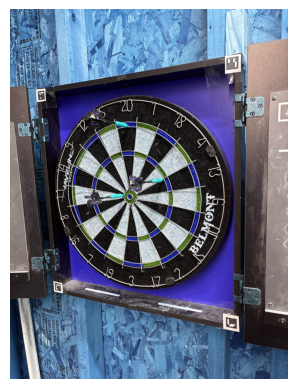

Starting..
Detected marker IDs: [[ 7]
 [10]
 [ 8]
 [ 9]]
Detected marker corners: (array([[[2347., 3357.],
        [2464., 3378.],
        [2467., 3485.],
        [2350., 3461.]]], dtype=float32), array([[[2482.,  648.],
        [2350.,  667.],
        [2354.,  534.],
        [2488.,  512.]]], dtype=float32), array([[[371., 888.],
        [377., 986.],
        [309., 995.],
        [300., 897.]]], dtype=float32), array([[[ 549., 2996.],
        [ 556., 3076.],
        [ 491., 3062.],
        [ 485., 2982.]]], dtype=float32))


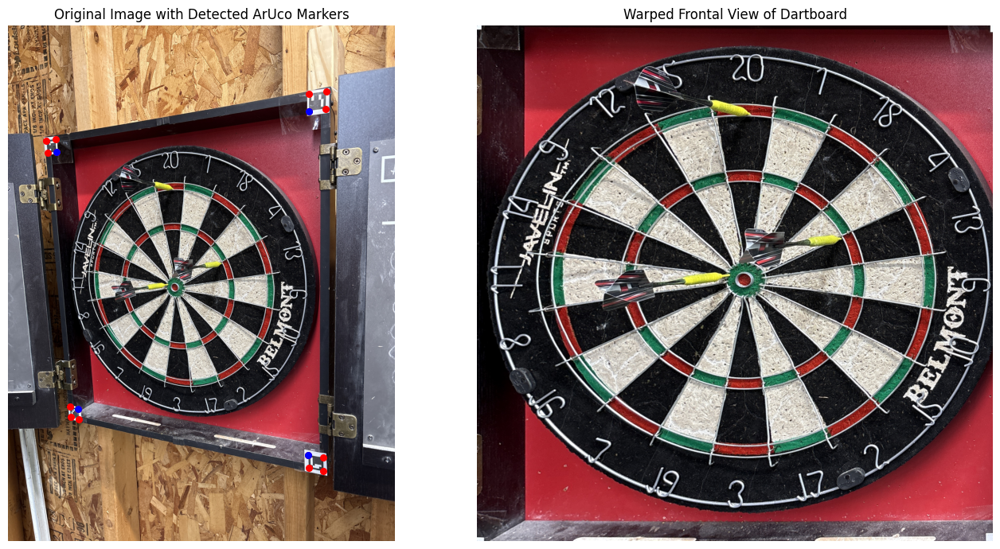

Next..
WTF
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


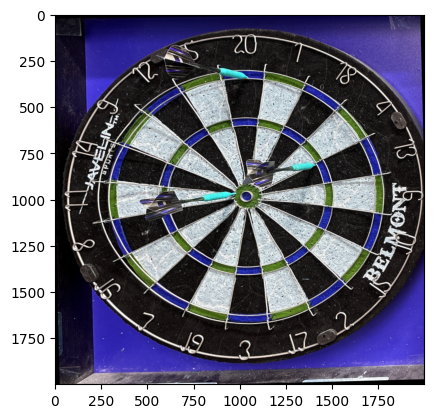

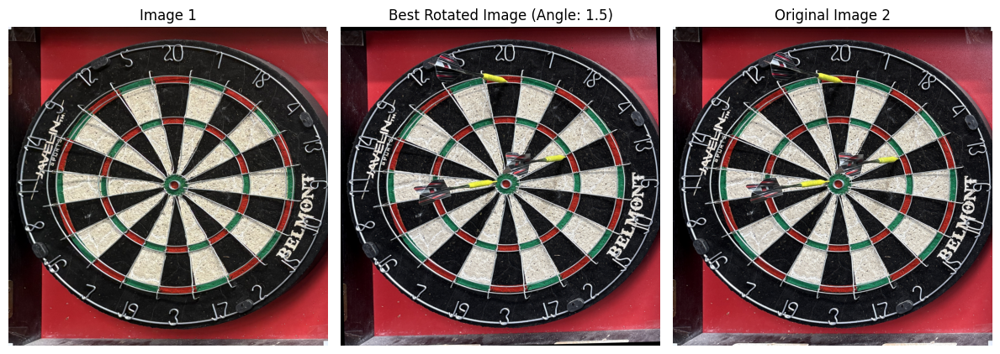

Now..


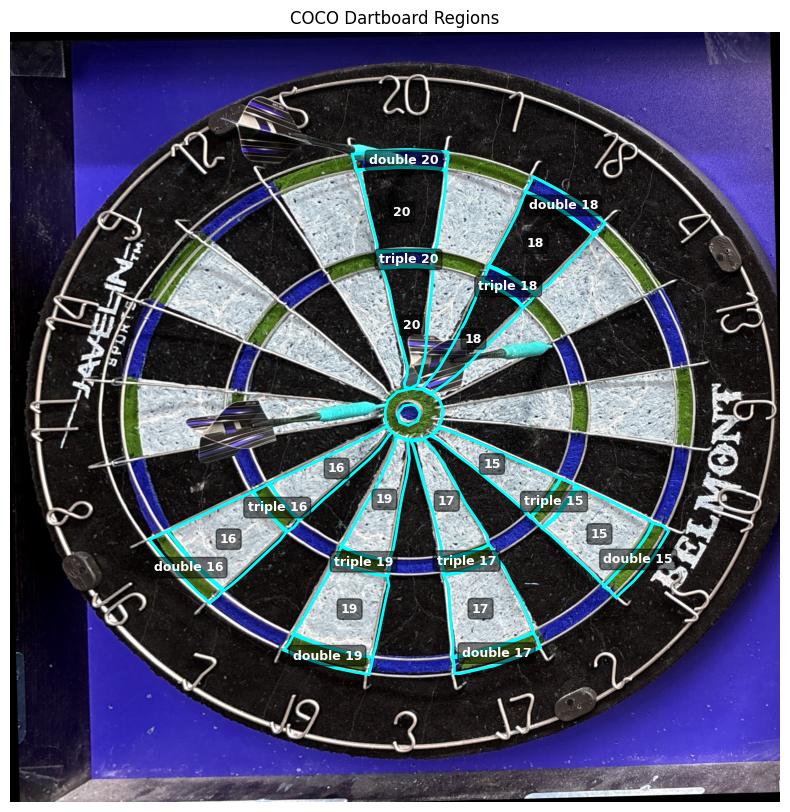

Dart at (975, 975) hit: missed
Dart at (1405, 822) hit: missed
double 20
Dart at (1040, 345) hit: double 20


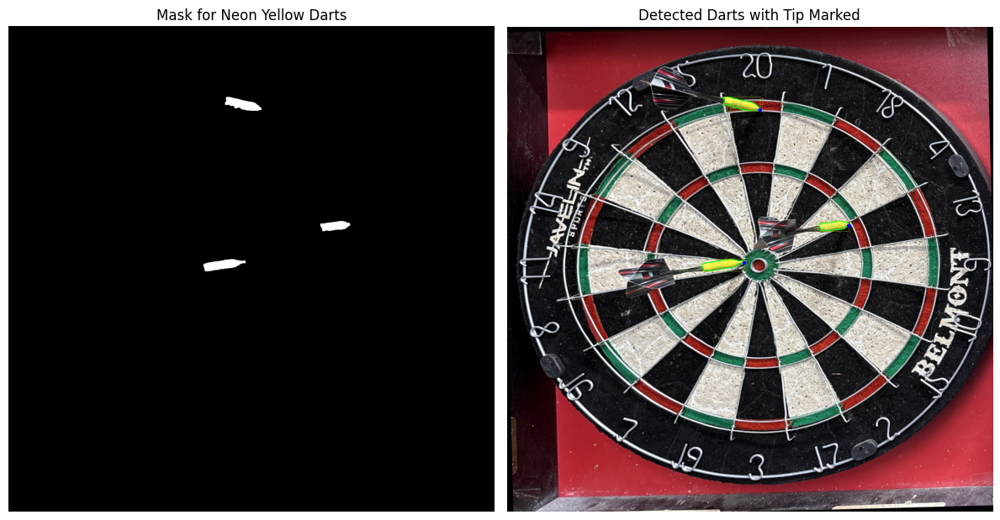

In [26]:
run_recent()

In [66]:
run_workflow("../Sample Images/IMG_3810.JPG","../Sample Images/template_aruco_blank.jpg")

error: OpenCV(4.11.0) :-1: error: (-5:Bad argument) in function 'cvtColor'
> Overload resolution failed:
>  - src is not a numpy array, neither a scalar
>  - Expected Ptr<cv::UMat> for argument 'src'


- low fails as it does not find all the Aruco's..

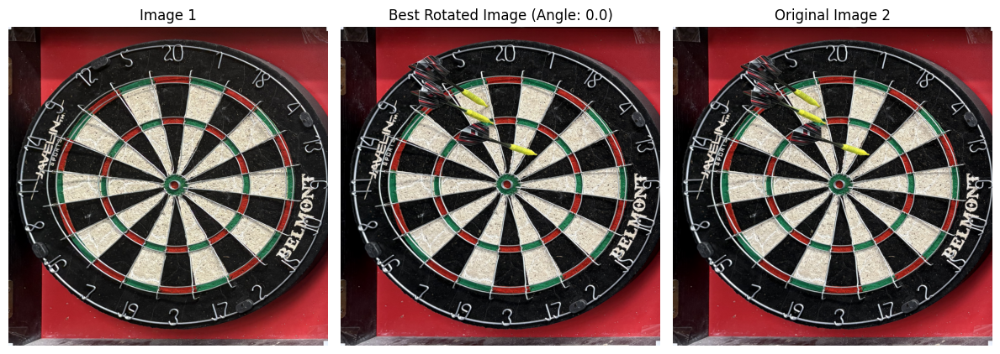

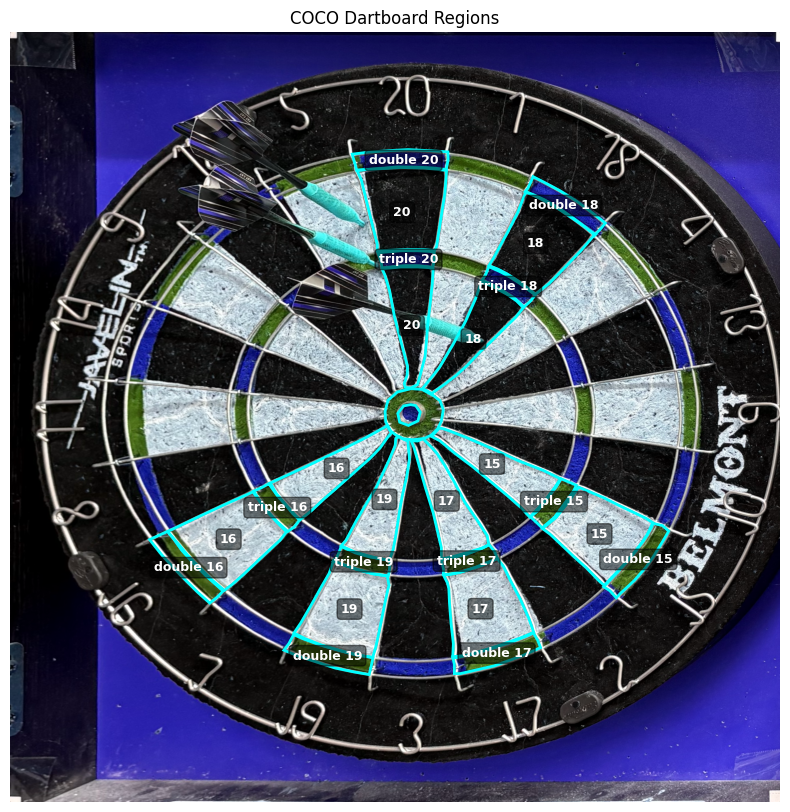

Dart at (1227, 806) hit: 18
Dart at (956, 611) hit: missed
Dart at (921, 505) hit: missed


In [79]:
run_workflow("../Sample Images/throw1_mid.jpeg","../Sample Images/template_aruco_blank.jpg")

- mid succeeds and the resulting diagram for scoring is almost perfect

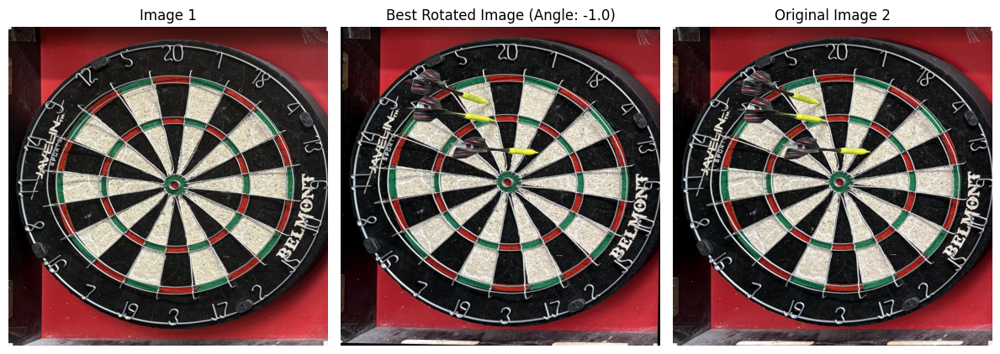

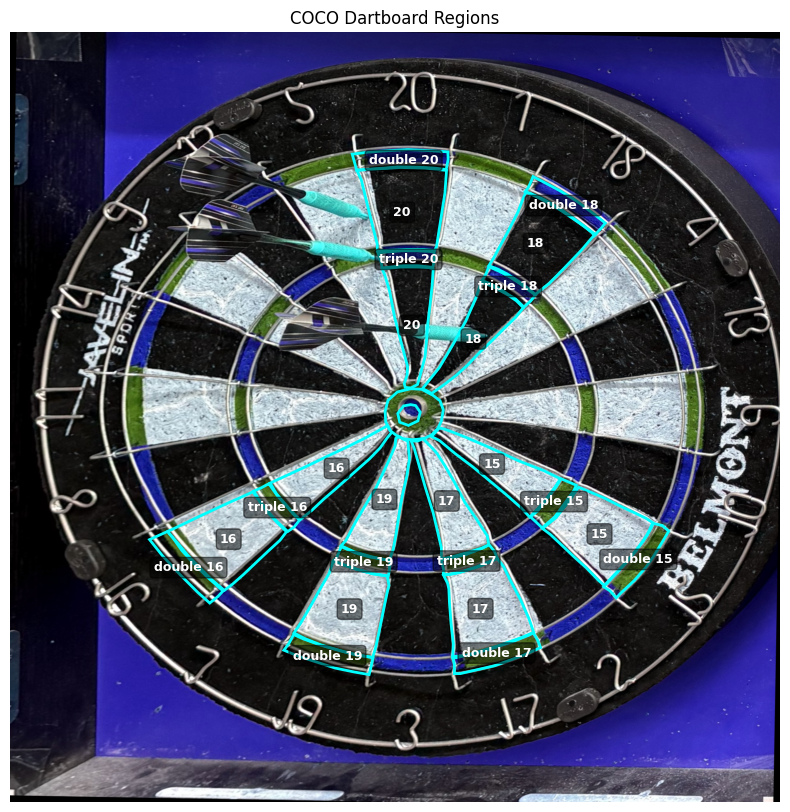

Dart at (1236, 793) hit: 18
Dart at (960, 593) hit: missed
Dart at (932, 485) hit: missed


In [81]:
run_workflow("../Sample Images/throw1_above.jpeg","../Sample Images/template_aruco_blank.jpg")

- above succeeds.. but it gets a little lucky. The resulting scoring mesh diagram is a little bit off in some areas.

In [82]:
run_workflow("../Sample Images/throw2_below.jpeg","../Sample Images/template_aruco_blank.jpg")

ValueError: Not all required ArUco markers were found.

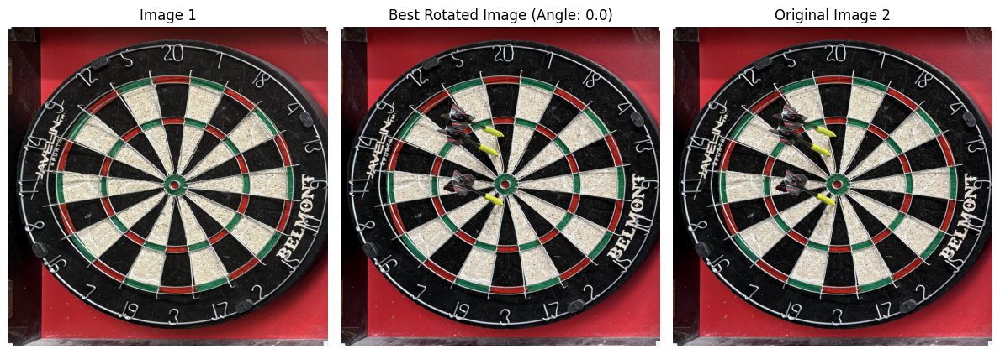

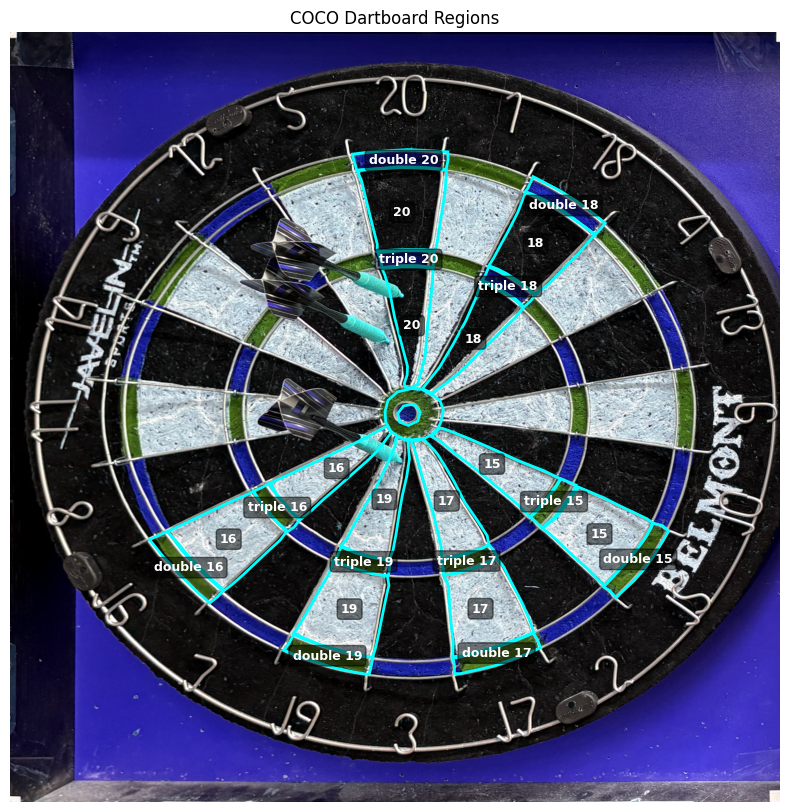

Dart at (1018, 1120) hit: 19
Dart at (986, 809) hit: missed
Dart at (1021, 690) hit: 20


In [83]:
run_workflow("../Sample Images/throw2_mid.jpeg","../Sample Images/template_aruco_blank.jpg")

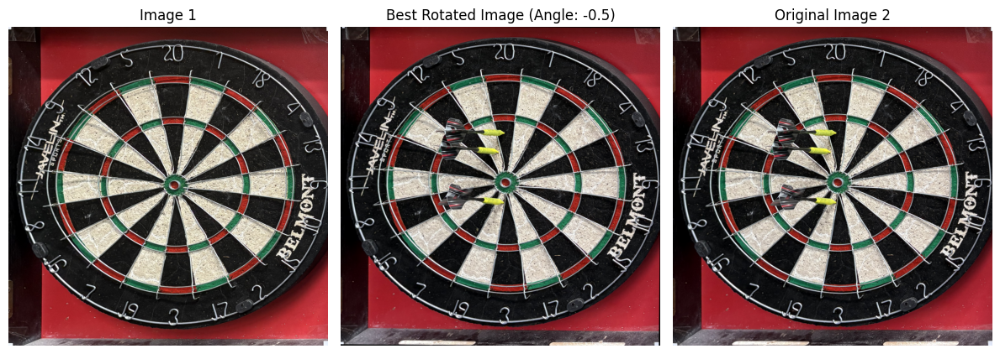

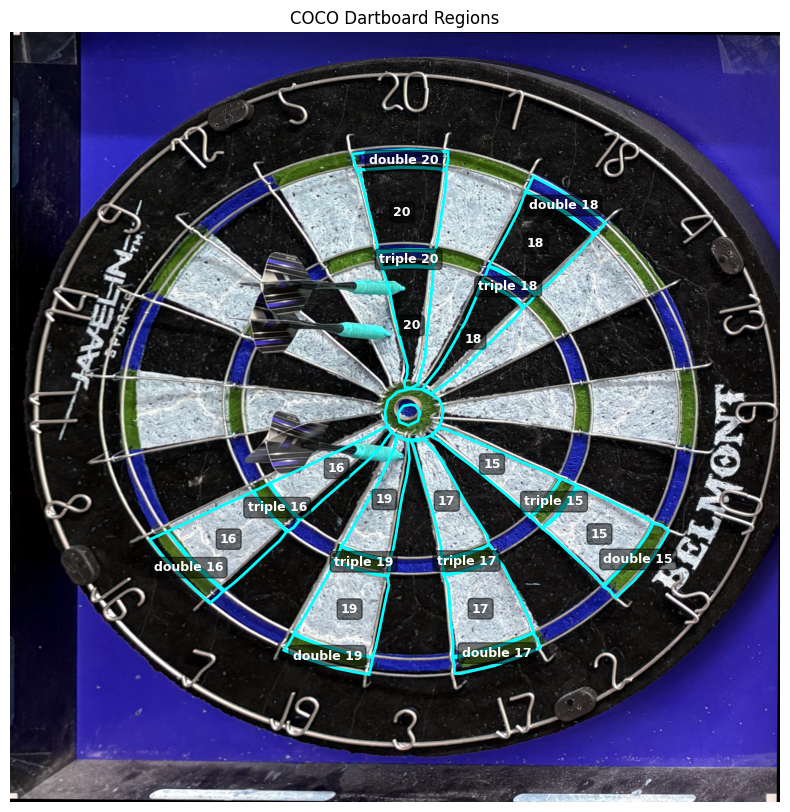

Dart at (1022, 1108) hit: 19
Dart at (988, 791) hit: missed
Dart at (1025, 672) hit: 20


In [84]:
run_workflow("../Sample Images/throw2_above.jpeg","../Sample Images/template_aruco_blank.jpg")

Hmmm. Pretty good - but here is an idea

<strong> What if our mappings could be dynamic? In such a way that we provide our tool with an intial guess of the mappings, but we rely on some sort of template match or line matching to get our regions to line up with the metal?</strong>

Remaining ideas:

- spray paint the TIPS of the darts to be very neon yellow - this will resolve issues where we detect the chunky part of the dart but not the tip
  - <strong> did this, it helps a lot </strong>
- figure out what specific angle works best for the homography.. is it high, low, or from the middle? This seems to have a bit of an effect on the transformation
  - <strong> taken from a middle angle works the best. We should experiment a bit with the angle in terms of how narrow/ acute to the board we can get now.. MID is the best height (taken at head level). This is because we really are just trying to recreate (as close as possible) the height and angle we took the blank dart board photo at. </strong>
- should we add in logic such that in the front end, if a dart is within say 15 pixels of another region, we ask the user to confirm the throw? We should probably always confirm a bull or double bull